In [2]:
import velot
import scanpy as sc
import scvelo as scv

/home/user/miniforge3/envs/velot/lib/python3.11/site-packages/torch/cuda/__init__.py:180: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 12020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /pytorch/c10/cuda/CUDAFunctions.cpp:119.)
  return torch._C._cuda_getDeviceCount() > 0


# Real Pancreas

In [1]:
import velot
import numpy as np
import scanpy as sc
import scvelo as scv

figures_path = "/home/user/Documents/velot/figures/figure 2"

# Load data
adata = sc.read_h5ad("/home/user/Documents/velot/notebooks/datasets/endocrinogenesis_day15.5_preprocessed.h5ad")

# Preprocess
velot.pp.pca(adata, n_pcs=20)
velot.pp.pseudotime(adata, root_cluster="Ngn3 low EP", cluster_key="clusters")
adata.obs["clusters_id"] = adata.obs["clusters"].cat.codes

# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_umap",
    smooth=True,
    n_clusters=None,
    window_size=20,
    overlap_fraction=0,
    spatial_key="clusters_id",
    reg=0.1, lambda_time=1, n_epochs=300, lambda_smooth=0.0, lambda_curl=1, lambda_divergence=0,
    project_umap=False
)

/home/user/miniforge3/envs/velot/lib/python3.11/site-packages/torch/cuda/__init__.py:180: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 12020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /pytorch/c10/cuda/CUDAFunctions.cpp:119.)
  return torch._C._cuda_getDeviceCount() > 0


VelOT: Computing velocity field
  Basis: X_umap (2D)
  Cells: 2531
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Using precomputed spatial labels from 'clusters_id': 7 clusters
  Built 122 window pairs across 7 clusters (skipped 0 small clusters)
  Window size: 20, step: 20

[2/4] Computing OT velocity...
  OT velocity computed: 2440 cells with velocity, 91 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.0125 reg=1.0275 smooth=0.0007 curl=0.0003
    epoch 100/300: total=0.9134 reg=0.9419 smooth=0.0012 curl=0.0001
    epoch 150/300: total=1.0400 reg=1.0751 smooth=0.0019 curl=0.0001
    epoch 200/300: total=1.1868 reg=1.2270 smooth=0.0019 curl=0.0001
    epoch 250/300: total=1.1261 reg=1.1646 smooth=0.0021 curl=0.0001
    epoch 300/300: total=0.9236 reg=0.9537 smooth=0.0022 curl=0.0001
  Smoothing complete: final total=0.9236

[4/4] UMAP projection: SKIPPED

VelOT: Done.


AnnData object with n_obs × n_vars = 2531 × 2000
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_pseudotime', 'pseudotime', 'clusters_id', 'velot_spatial_cluster', 'velot_confidence'
    var: 'highly_variable_genes', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'clusters_colors', 'clusters_fine_colors', 'diffmap_evals', 'iroot', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'velot_windows', 'velot_smoothing'
    o

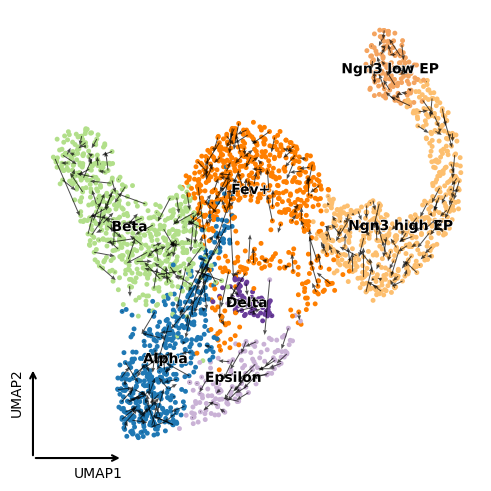

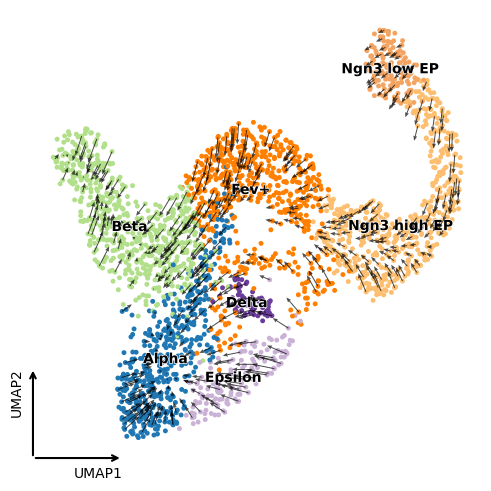

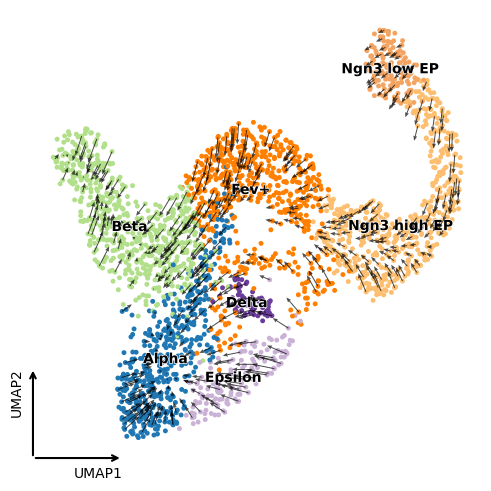

In [5]:
velot.pl.velocity_quiver(adata, color="clusters", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_raw", show=True)
velot.pl.velocity_quiver(adata, color="clusters", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity", show=True)

In [ ]:
# # Visualize
# velot.pl.dataset_overview_simple(adata, color="clusters", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure2_a.png")
# velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure2_b.png")
# velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure2_c.png")
# velot.pl.velocity_stream(adata, color="clusters", title=None, figsize=(5,5), save=f"{figures_path}/figure2_d.png")
# velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure2_e.png")
# velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure2_f.png")

# # Evaluate
# edges = [
#     ('Ngn3 low EP', 'Ngn3 high EP'), 
#     ('Ngn3 high EP', 'Fev+'),
#     ('Fev+', 'Delta'), 
#     ('Fev+', 'Beta'),
#     ('Fev+','Epsilon'),
#     ('Fev+','Alpha')
# ]
# results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="clusters")
# velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure2_g.png")

# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_umap",
    start_cluster="Beta",
    target_cluster="Ngn3 high EP",
    direction="backward",
    use_network=True,
    evolve_pseudotime=True,
    n_trajectories=30,
    cluster_key="clusters",
    n_steps=300, step_size=2
)
velot.pl.trajectories(
    adata, color="clusters", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=True, basis="umap", save=f"{figures_path}/figure2_j.png")

# Real Dendate

Filtered out 10652 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
VelOT: Computing velocity field
  Basis: X_pca (20D)
  Cells: 2930
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Using precomputed spatial labels from 'clusters_id': 14 clusters
  Built 39 window pairs across 11 clusters (skipped 3 small clusters)
  Window size: 100, step: 95

[2/4] Computing OT velocity...
  OT velocity computed: 2754 cells with velocity, 176 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: reg=238.4806 smooth=1.1655
    epoch 100/300: reg=245.5122 smooth=2.6698
    epoch 150/300: reg=204.1447 smooth=3.7149
    epoch 200/300: reg=229.7132 smooth=3.3571
    epoch 250/300: reg=181.4113 smooth=3.7152
    epoch 300/300: reg=256.6504 smooth=4.0915
  Smoothing complete: final reg=256.6504, smooth=4.0915

[4/4] Projecting to UMAP...
  Velocity projected to UMAP (2930 cells)

VelOT: Done.


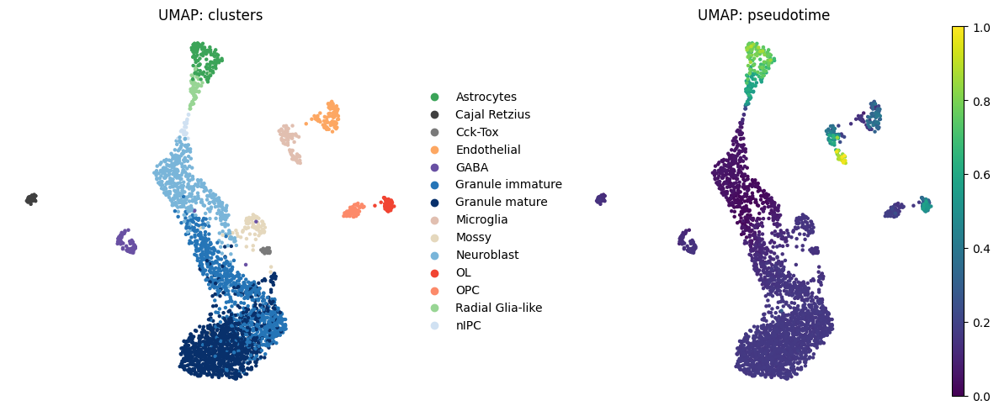

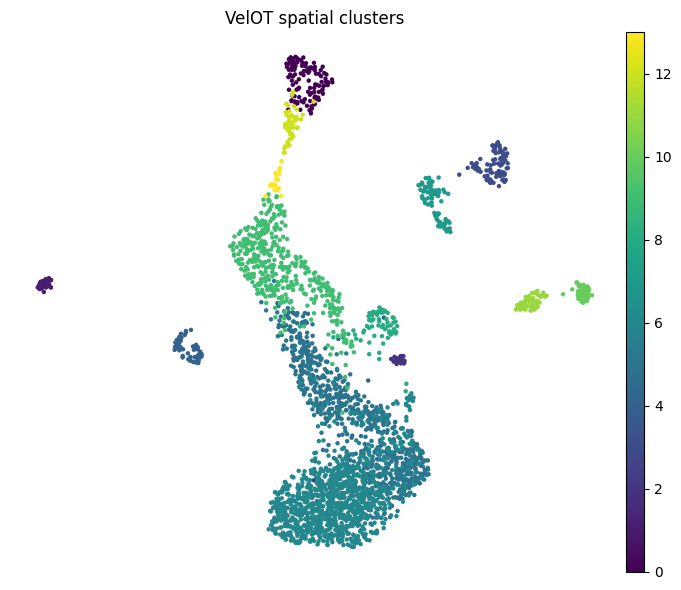

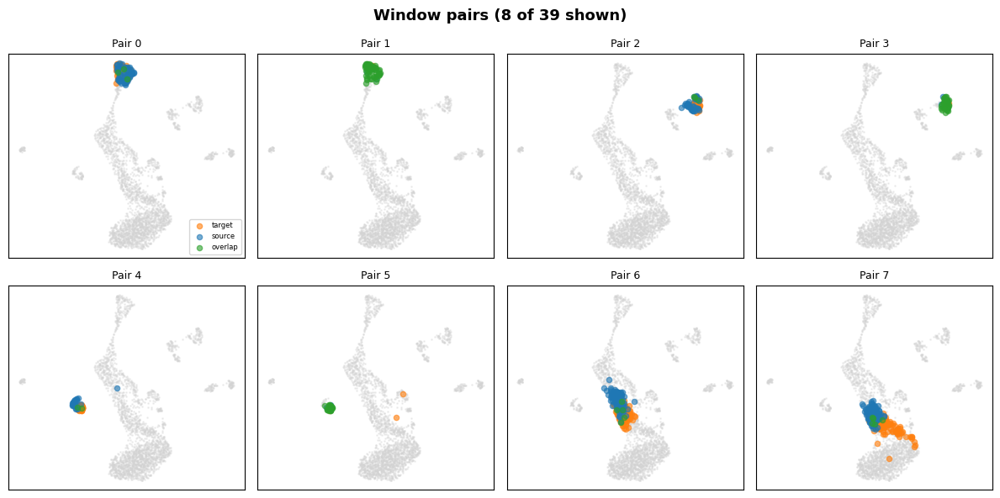

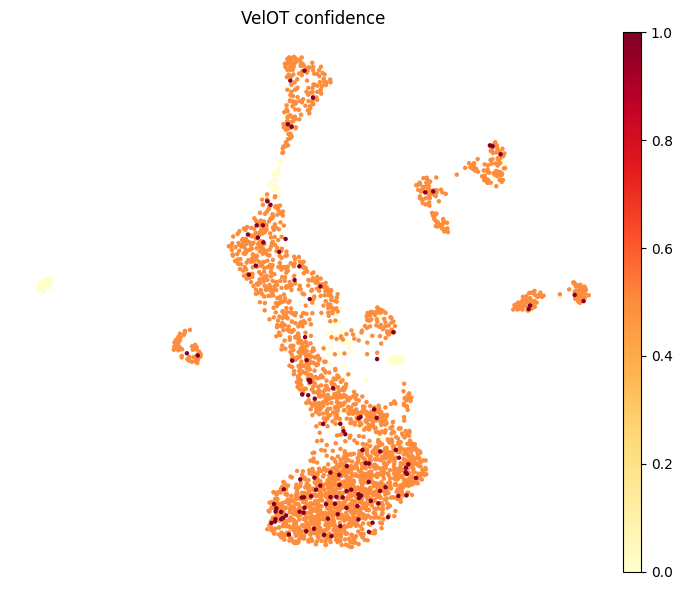

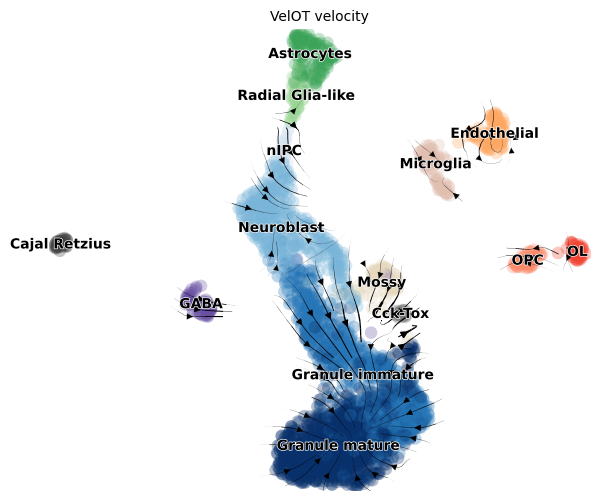

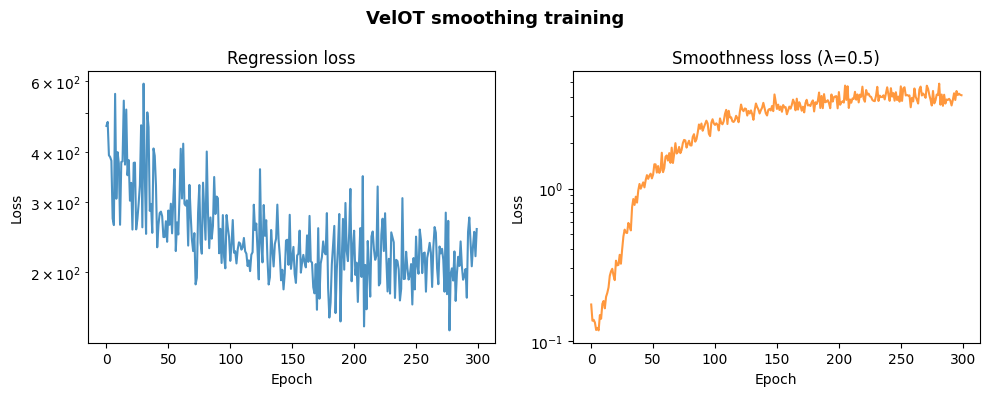

VelOT Velocity Metrics

Inner-Cluster Coherence (mean: 0.330):
                 Astrocytes: 0.121
              Cajal Retzius: 0.692
                    Cck-Tox: 0.419
                Endothelial: 0.144
                       GABA: 0.454
           Granule immature: 0.419
             Granule mature: 0.124
                  Microglia: 0.342
                      Mossy: 0.414
                 Neuroblast: 0.399
                         OL: 0.254
                        OPC: 0.119
           Radial Glia-like: 0.077
                       nIPC: 0.645

Cross-Boundary Correctness (mean: 0.466):
              OPC → OL             : 0.194
  Radial Glia-like → Astrocytes     : 0.643
       Neuroblast → Granule immature: 0.559


{'iccoh': {'Astrocytes': 0.1210959044711896,
  'Cajal Retzius': 0.6924061128045823,
  'Cck-Tox': 0.41895466481003335,
  'Endothelial': 0.14350128137465584,
  'GABA': 0.45416690135666954,
  'Granule immature': 0.41905244889746135,
  'Granule mature': 0.12361682195272526,
  'Microglia': 0.3419959195192033,
  'Mossy': 0.41405459091146224,
  'Neuroblast': 0.39870681339366265,
  'OL': 0.2539794722649298,
  'OPC': 0.11891741287921999,
  'Radial Glia-like': 0.07701583507142383,
  'nIPC': 0.6445002772424913},
 'iccoh_mean': 0.33014031835355073,
 'cbdir': {('OPC', 'OL'): 0.19444444444444445,
  ('Radial Glia-like', 'Astrocytes'): 0.64271455883298,
  ('Neuroblast', 'Granule immature'): 0.5594150703747639},
 'cbdir_mean': 0.4655246912173961}

In [14]:
# Load data
adata = velot.datasets.dentategyrus()

# Preprocess
scv.pp.filter_and_normalize(adata, min_shared_counts=20, min_shared_cells=10)
velot.pp.pca(adata, n_pcs=20)
velot.pp.neighbors(adata, 20)
velot.pp.pseudotime(adata, root_cluster="Neuroblast", cluster_key="clusters")
adata.obs["clusters_id"] = adata.obs["clusters"].cat.codes

# Compute velocity (full pipeline)
velot.tl.velocity(adata, "X_pca", True, None, 100, 0.05, spatial_key="clusters_id", reg=0.1, n_epochs=300, project_umap=True)

# Visualize
velot.pl.dataset_overview(adata, color="clusters")
velot.pl.spatial_clusters(adata)
velot.pl.windows(adata, max_show=8)
velot.pl.confidence(adata)
velot.pl.velocity_stream(adata, color="clusters")
velot.pl.training_curves(adata)

# Evaluate
edges = [
    ('OPC', 'OL'),
    ('Radial Glia-like', 'Astrocytes'),
    ('Neuroblast', 'Granule immature')
]

velot.metrics.summary(adata, cluster_edges=edges, cluster_key="clusters")

# Real Erythroid

Filtered out 47628 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
VelOT: Computing velocity field
  Basis: X_umap (2D)
  Cells: 9815
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Using precomputed spatial labels from 'clusters_id': 5 clusters
  Built 36 window pairs across 5 clusters (skipped 0 small clusters)
  Window size: 250, step: 250

[2/4] Computing OT velocity...
  OT velocity computed: 9000 cells with velocity, 815 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.1459 reg=0.1659 smooth=0.0001 curl=0.0000
    epoch 100/300: total=0.8802 reg=0.1275 smooth=0.0001 curl=0.0000
    epoch 150/300: total=1.1329 reg=0.1635 smooth=0.0001 curl=0.0000
    epoch 200/300: total=0.9121 reg=0.1323 smooth=0.0002 curl=0.0000
    epoch 250/300: total=0.8587 reg=0.1245 smooth=0.0001 curl=0.0000
    epoch 300/300: total=0.9331 reg=0.1354 smooth=0.0001 curl=0.0000
  Smoothing complete:

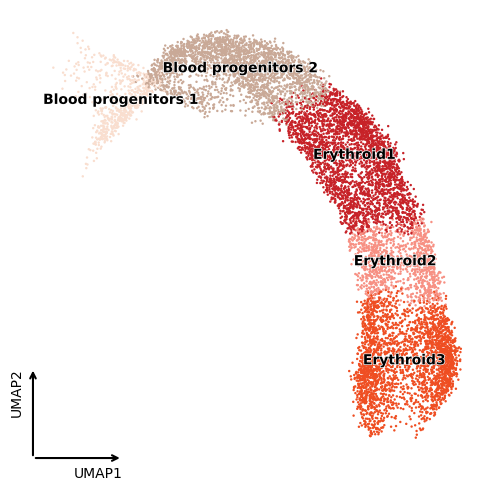

Plotting in scanpy


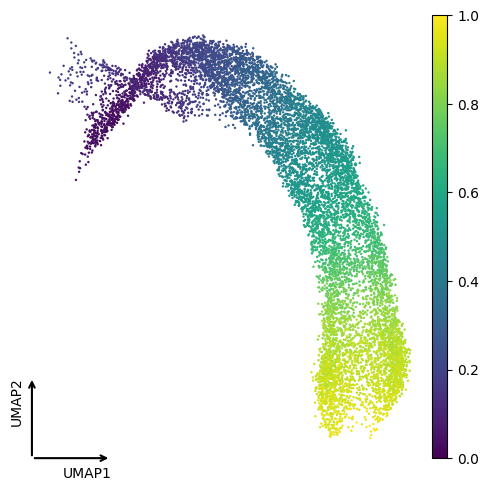

Plotting in scanpy


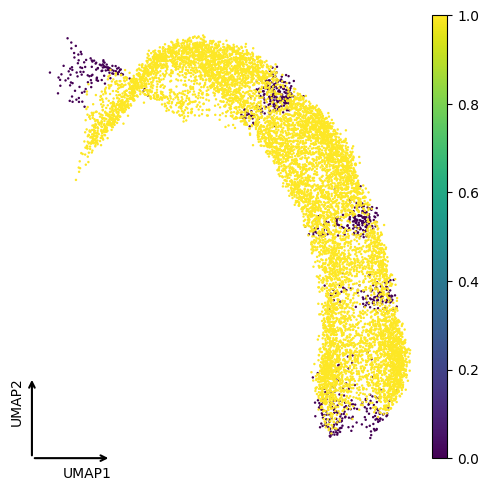

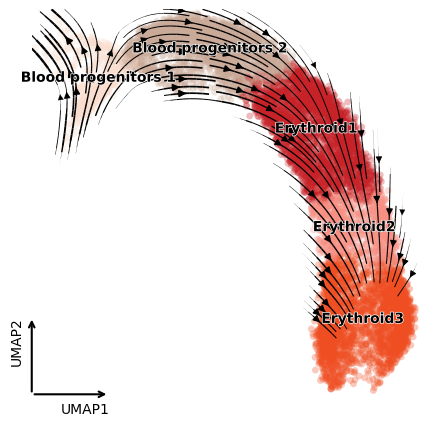

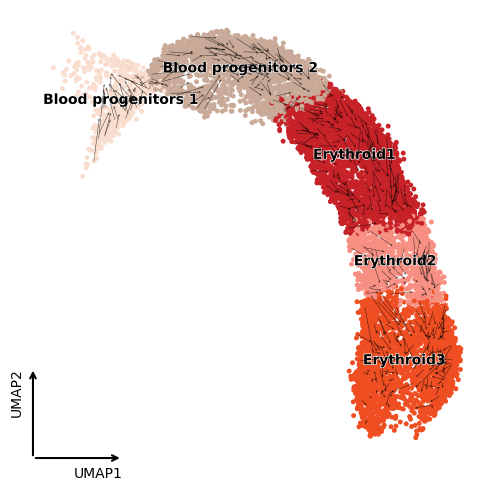

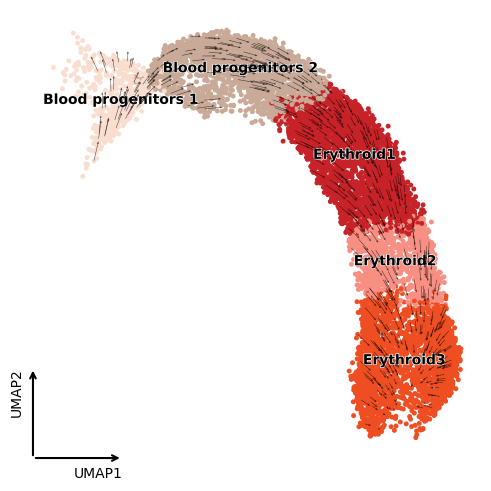

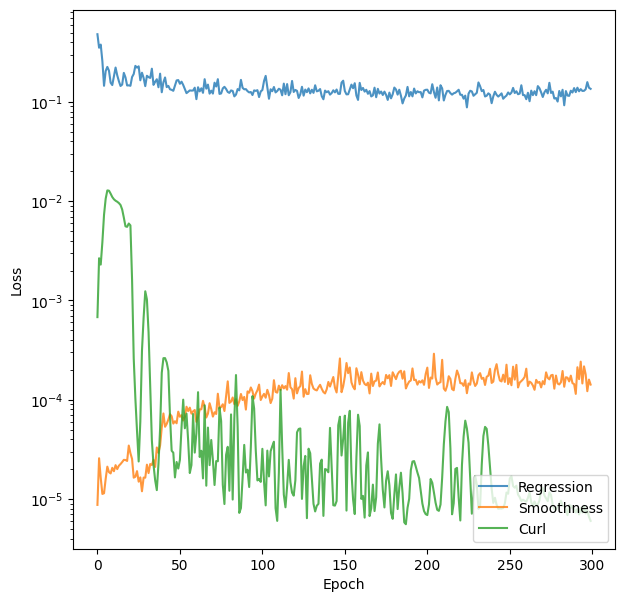

VelOT Velocity Metrics

Inner-Cluster Coherence (mean: 0.973):
        Blood progenitors 1: 0.961
        Blood progenitors 2: 0.991
                 Erythroid1: 0.989
                 Erythroid2: 0.991
                 Erythroid3: 0.935

Cross-Boundary Correctness (mean: 0.931):
  Blood progenitors 1 → Blood progenitors 2: 0.831
  Blood progenitors 2 → Erythroid1     : 0.943
       Erythroid1 → Erythroid2     : 0.974
       Erythroid2 → Erythroid3     : 0.977


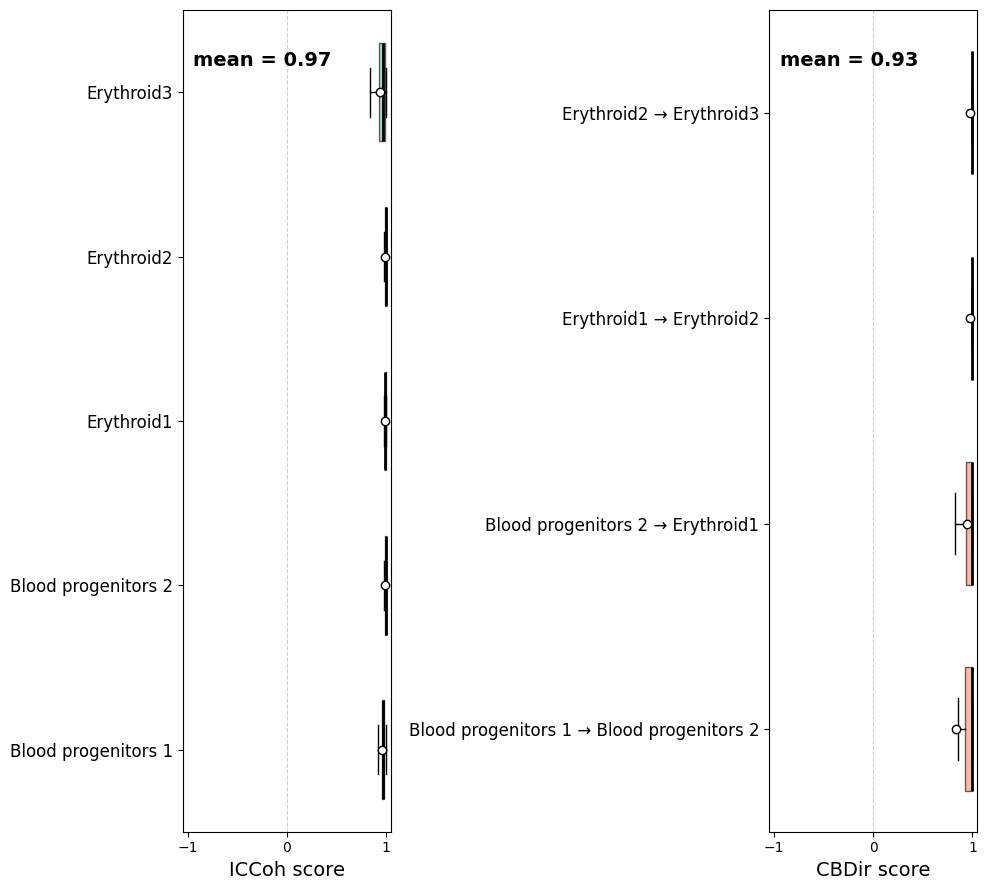

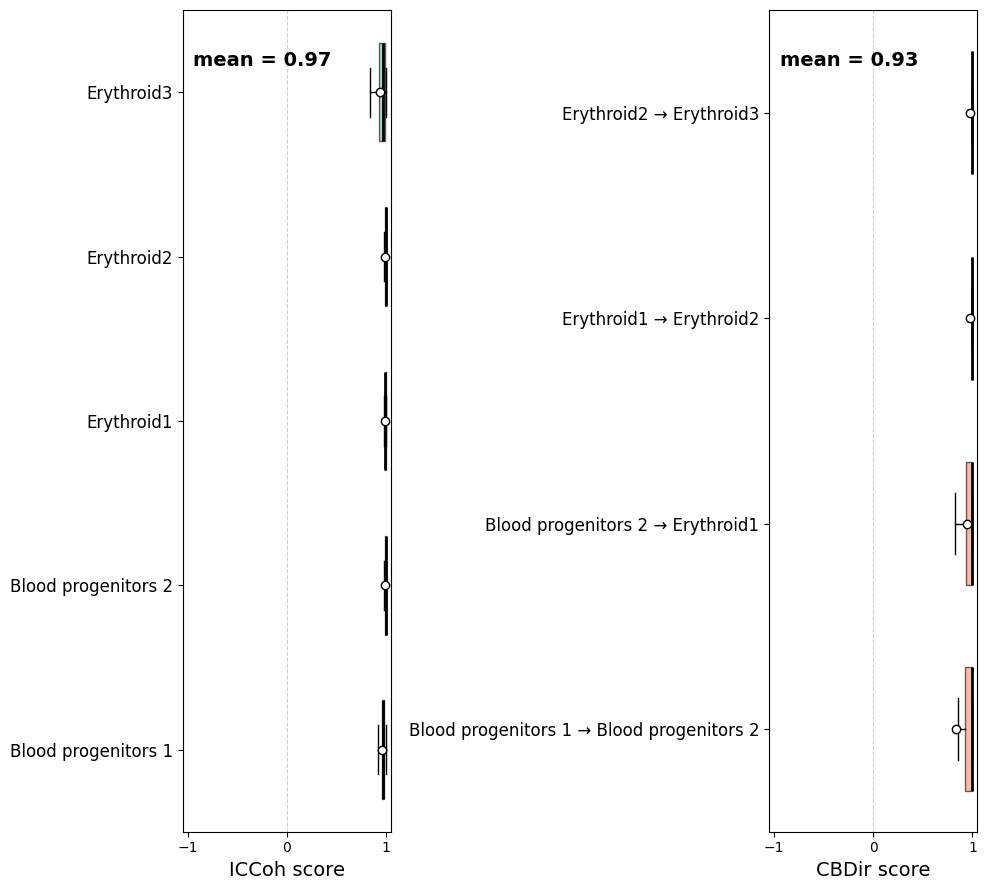

In [ ]:
figures_path = "/home/user/Documents/velot/figures/figure 4"

# Load data
# Load data
adata = velot.datasets.erythroid()

# Preprocess
scv.pp.filter_and_normalize(adata, min_shared_counts=20, min_shared_cells=10)
velot.pp.neighbors(adata, 20)
velot.pp.pseudotime(adata, root_cluster="Blood progenitors 1", cluster_key="celltype")
adata.obs["clusters_id"] = adata.obs["celltype"].cat.codes

# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_umap",
    smooth=True,
    n_clusters=None,
    window_size=250,
    overlap_fraction=0,
    spatial_key="clusters_id",
    reg=0.2, lambda_time=1, n_epochs=300, lambda_smooth=0.0, lambda_curl=1, lambda_divergence=0,
    project_umap=False
)

# Visualize
velot.pl.dataset_overview_simple(adata, color="celltype", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure4_a.png")
velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure4_b.png")
velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure4_c.png")
velot.pl.velocity_stream(adata, color="celltype", title=None, figsize=(5,5), save=f"{figures_path}/figure4_d.png")

velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap_raw", show=True, save=f"{figures_path}/figure4_e.png")
velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap", show=True, save=f"{figures_path}/figure4_f.png")

# velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure4_e.png")
velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure4_g.png")

# Evaluate
edges = [
    ('Blood progenitors 1', 'Blood progenitors 2'), 
    ('Blood progenitors 2', 'Erythroid1'),
    ('Erythroid1', 'Erythroid2'), 
    ('Erythroid2', 'Erythroid3')
]

results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="celltype", velocity_key="velot_velocity_umap")
velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure4_h.png")

  Starting cells: 342 candidates (pseudotime=[min, 0.050])
  Total: 30 trajectories (forward) from 'None'
  Using continuous velocity field (neural network)
  Forward — Terminal clusters: {np.str_('Blood progenitors 1'): np.int64(15), np.str_('Blood progenitors 2'): np.int64(6), np.str_('Erythroid3'): np.int64(9)}


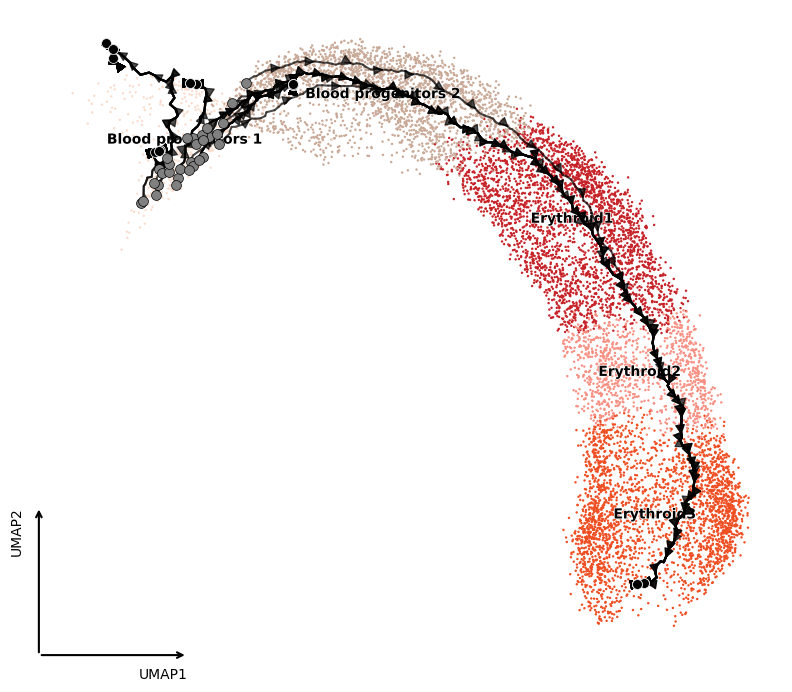

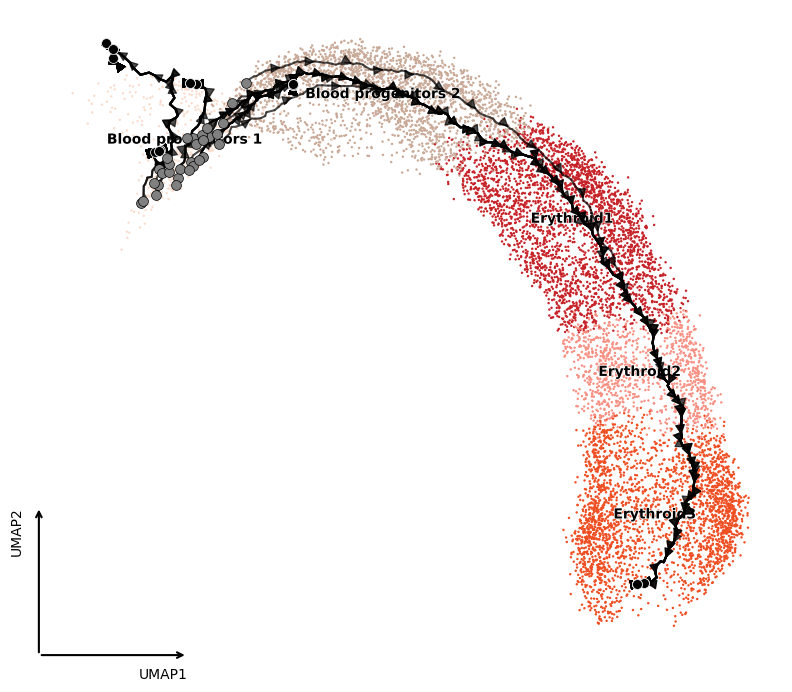

In [19]:
# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_umap",
    velocity_key="velot_velocity_umap",
    direction="forward",
    use_network=True,
    evolve_pseudotime=True,
    end_pseudotime=0.05,
    n_trajectories=30,
    cluster_key="celltype",
    n_steps=300, step_size=2
)
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=True, basis="umap", save=f"{figures_path}/figure4_i.png")

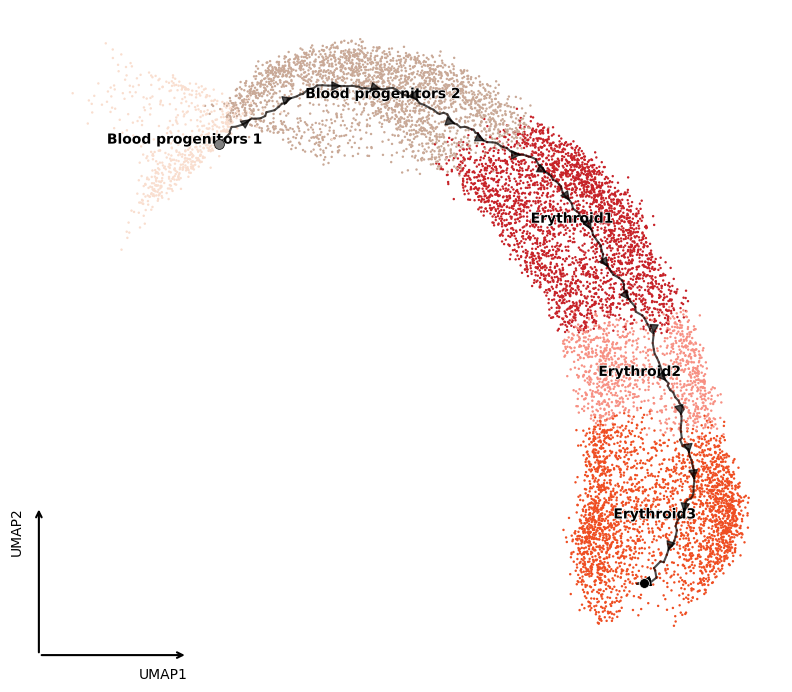

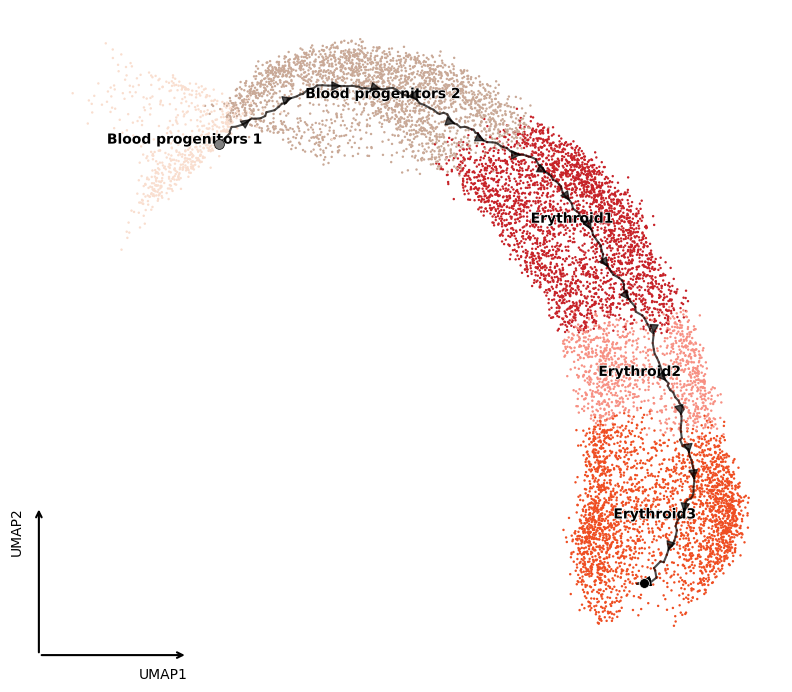

In [21]:
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=True, basis="umap", save=f"{figures_path}/figure4_i.png", trajectory_ids=[0])

## Erythroid further testing

In [1]:
import velot
import scanpy as sc
import scvelo as scv

/home/user/miniforge3/envs/velot/lib/python3.11/site-packages/torch/cuda/__init__.py:180: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 12020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /pytorch/c10/cuda/CUDAFunctions.cpp:119.)
  return torch._C._cuda_getDeviceCount() > 0


Filtered out 47628 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
VelOT: Computing velocity field
  Basis: X_umap (2D)
  Cells: 9815
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Using precomputed spatial labels from 'clusters_id': 5 clusters
  Built 30 window pairs across 5 clusters (skipped 0 small clusters)
  Window size: 300, step: 300

[2/4] Computing OT velocity...
  OT velocity computed: 9000 cells with velocity, 815 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.1147 reg=0.1794 smooth=0.0000 curl=0.0013
    epoch 100/300: total=1.0333 reg=0.1679 smooth=0.0000 curl=0.0010
    epoch 150/300: total=1.0434 reg=0.1674 smooth=0.0000 curl=0.0014
    epoch 200/300: total=1.1241 reg=0.1825 smooth=0.0000 curl=0.0010
    epoch 250/300: total=1.1142 reg=0.1798 smooth=0.0000 curl=0.0012
    epoch 300/300: total=1.0369 reg=0.1692 smooth=0.0000 curl=0.0010
  Smoothing complete:

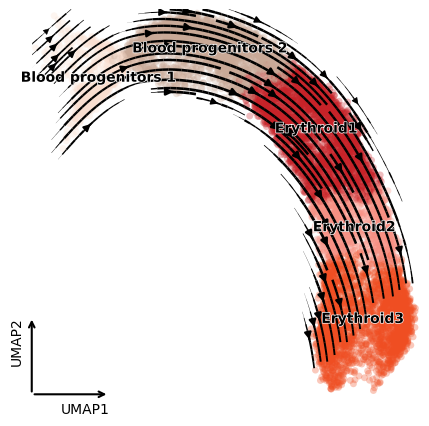

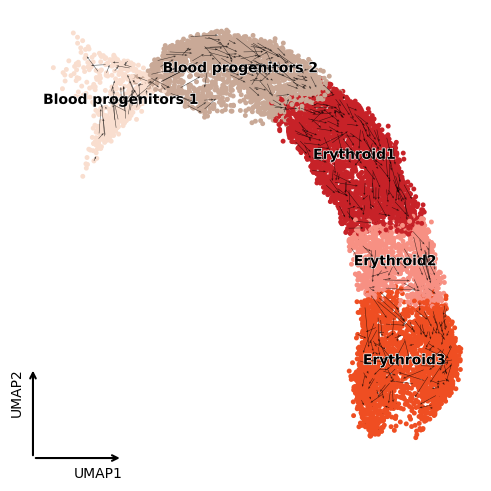

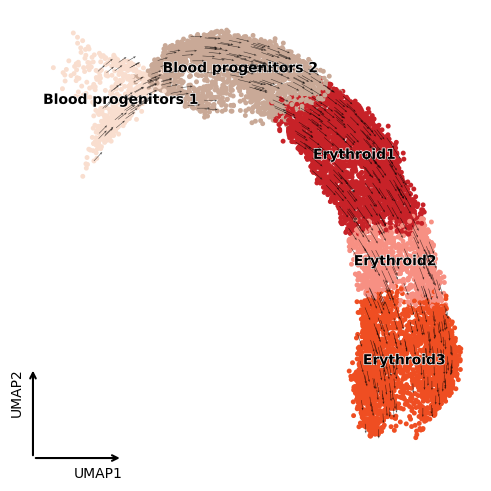

VelOT Velocity Metrics

Inner-Cluster Coherence (mean: 0.997):
        Blood progenitors 1: 0.993
        Blood progenitors 2: 0.997
                 Erythroid1: 0.998
                 Erythroid2: 0.999
                 Erythroid3: 0.999

Cross-Boundary Correctness (mean: 0.966):
  Blood progenitors 1 → Blood progenitors 2: 0.981
  Blood progenitors 2 → Erythroid1     : 0.940
       Erythroid1 → Erythroid2     : 0.968
       Erythroid2 → Erythroid3     : 0.976


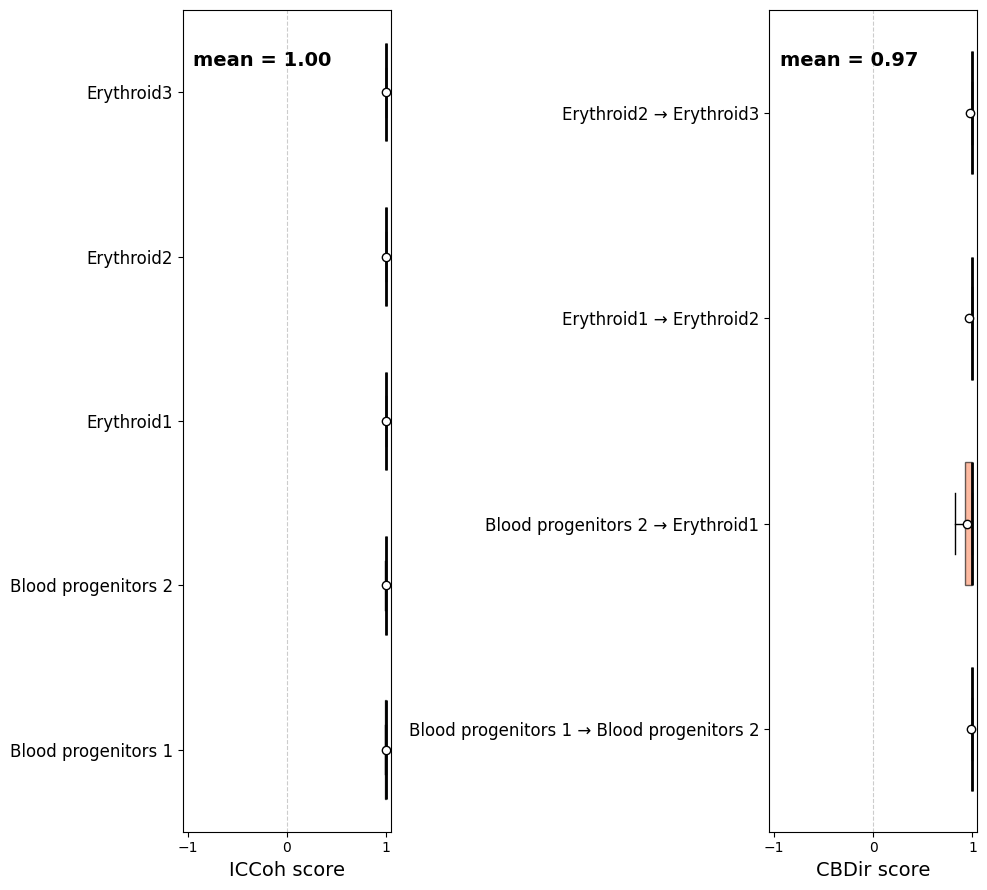

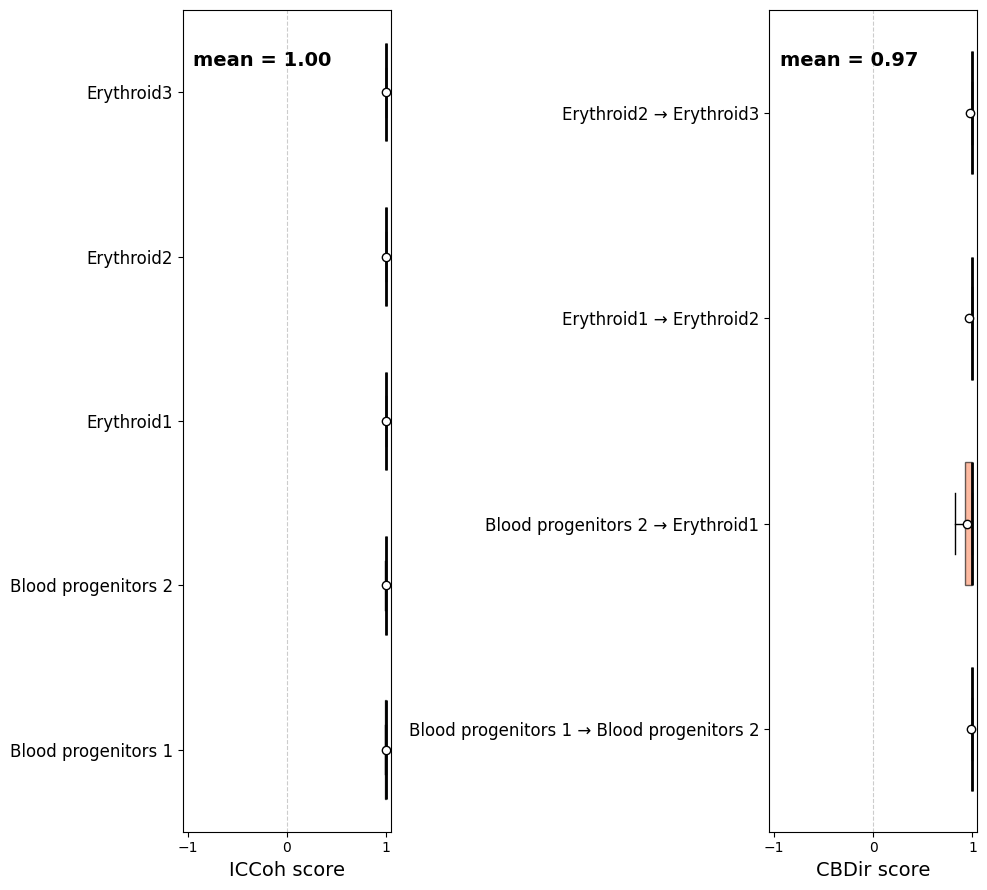

In [28]:
figures_path = "/home/user/Documents/velot/figures/figure 5"

# Load data
adata = velot.datasets.erythroid()

# Preprocess
scv.pp.filter_and_normalize(adata, min_shared_counts=20, min_shared_cells=10)
velot.pp.neighbors(adata, 20)
velot.pp.pseudotime(adata, root_cluster="Blood progenitors 1", cluster_key="celltype")
adata.obs["clusters_id"] = adata.obs["celltype"].cat.codes

# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_umap",
    smooth=True,
    n_clusters=None,
    window_size=300,
    overlap_fraction=0,
    spatial_key="clusters_id",
    reg=0.05, lambda_time=1, n_epochs=300, lambda_smooth=0.2, lambda_curl=0.2, lambda_divergence=0,
    project_umap=False
)

# Visualize
# velot.pl.dataset_overview_simple(adata, color="celltype", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure4_a.png")
# velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure4_b.png")
# velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure4_c.png")
velot.pl.velocity_stream(adata, color="celltype", title=None, figsize=(5,5), save=f"{figures_path}/figure4_d.png")

velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap_raw", show=True, save=f"{figures_path}/figure4_e.png")
velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap", show=True, save=f"{figures_path}/figure4_f.png")

# velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure4_g.png")

# Evaluate
edges = [
    ('Blood progenitors 1', 'Blood progenitors 2'), 
    ('Blood progenitors 2', 'Erythroid1'),
    ('Erythroid1', 'Erythroid2'), 
    ('Erythroid2', 'Erythroid3')
]

results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="celltype", velocity_key="velot_velocity_umap")
velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure4_h.png")

In [29]:
# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_umap",
    velocity_key="velot_velocity_umap",
    direction="forward",
    use_network=True,
    evolve_pseudotime=True,
    end_pseudotime=0.05,
    n_trajectories=30,
    cluster_key="celltype",
    n_steps=300, step_size=2
)

  Starting cells: 342 candidates (pseudotime=[min, 0.050])
  Total: 30 trajectories (forward) from 'None'
  Using continuous velocity field (neural network)
  Forward — Terminal clusters: {np.str_('Erythroid3'): np.int64(30)}


AnnData object with n_obs × n_vars = 9815 × 6173
    obs: 'sample', 'stage', 'sequencing.batch', 'theiler', 'celltype', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'dpt_pseudotime', 'pseudotime', 'clusters_id', 'velot_spatial_cluster', 'velot_confidence'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'MURK_gene', 'Δm', 'scaled Δm', 'gene_count_corr'
    uns: 'celltype_colors', 'neighbors', 'iroot', 'diffmap_evals', 'velot_windows', 'velot_smoothing', 'velot_trajectories'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'velot_velocity_umap', 'velot_velocity_umap_raw'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

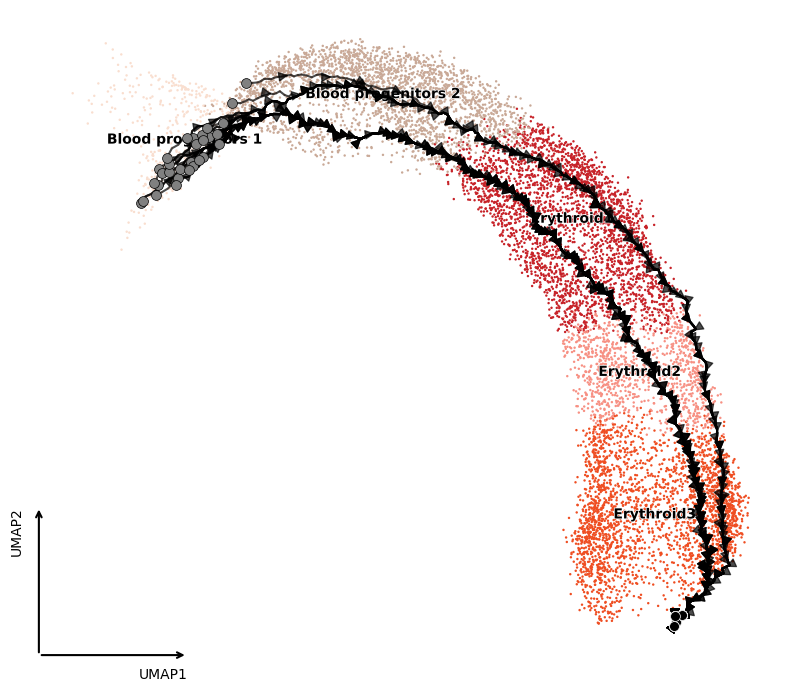

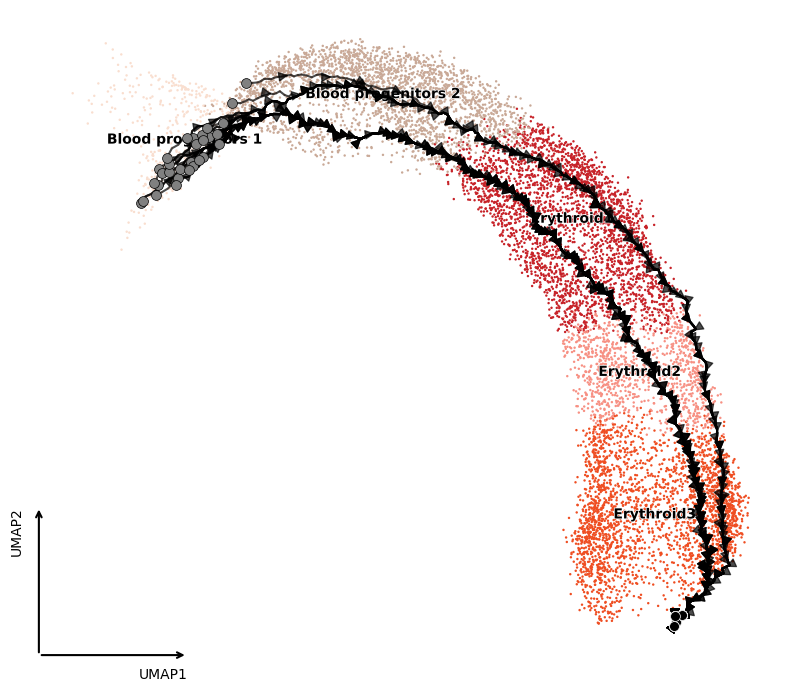

In [31]:
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=True, basis="umap", save=f"{figures_path}/figure4_i.png")

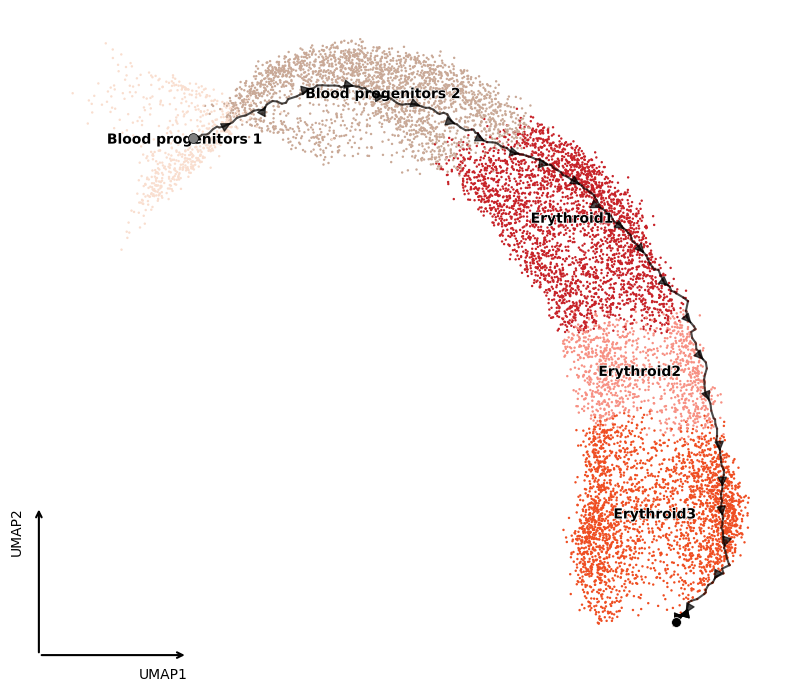

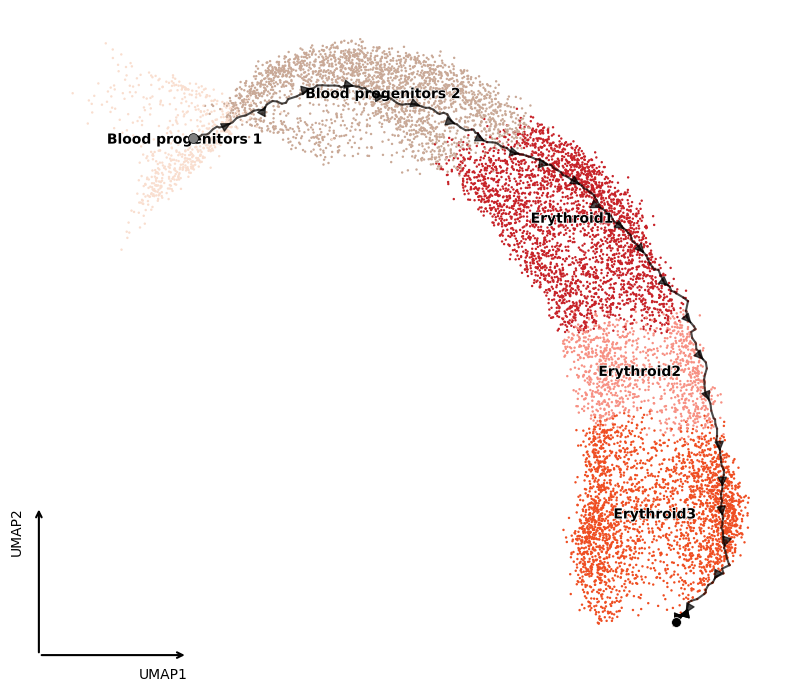

In [37]:
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=True, basis="umap", save=f"{figures_path}/figure4_i.png", trajectory_ids=[6])

## Tests in pca space

In [1]:
import velot
import scanpy as sc
import scvelo as scv

/home/user/miniforge3/envs/velot/lib/python3.11/site-packages/torch/cuda/__init__.py:180: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 12020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /pytorch/c10/cuda/CUDAFunctions.cpp:119.)
  return torch._C._cuda_getDeviceCount() > 0


Filtered out 47628 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
VelOT: Computing velocity field
  Basis: X_pca (10D)
  Cells: 9815
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Using precomputed spatial labels from 'clusters_id': 5 clusters
  Built 47 window pairs across 5 clusters (skipped 0 small clusters)
  Window size: 200, step: 200

[2/4] Computing OT velocity...
  OT velocity computed: 9400 cells with velocity, 415 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.0085 reg=2.9750 smooth=0.0010 curl=0.0000
    epoch 100/300: total=1.1861 reg=3.6286 smooth=0.0007 curl=0.0000
    epoch 150/300: total=1.0404 reg=3.1848 smooth=0.0006 curl=0.0000
    epoch 200/300: total=1.1082 reg=3.4038 smooth=0.0006 curl=0.0000
    epoch 250/300: total=0.8513 reg=2.5914 smooth=0.0006 curl=0.0000
    epoch 300/300: total=1.0414 reg=3.1958 smooth=0.0006 curl=0.0000
  Smoothing complete:

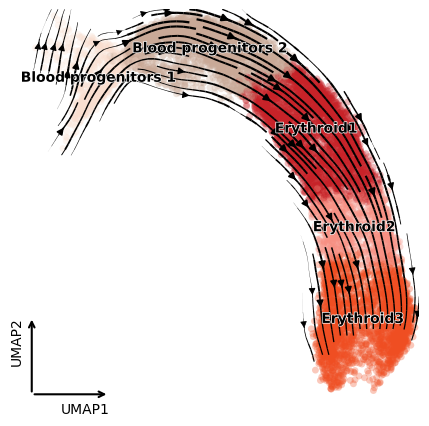

VelOT Velocity Metrics

Inner-Cluster Coherence (mean: 0.953):
        Blood progenitors 1: 0.912
        Blood progenitors 2: 0.954
                 Erythroid1: 0.970
                 Erythroid2: 0.972
                 Erythroid3: 0.955

Cross-Boundary Correctness (mean: 0.961):
  Blood progenitors 1 → Blood progenitors 2: 0.975
  Blood progenitors 2 → Erythroid1     : 0.934
       Erythroid1 → Erythroid2     : 0.960
       Erythroid2 → Erythroid3     : 0.974


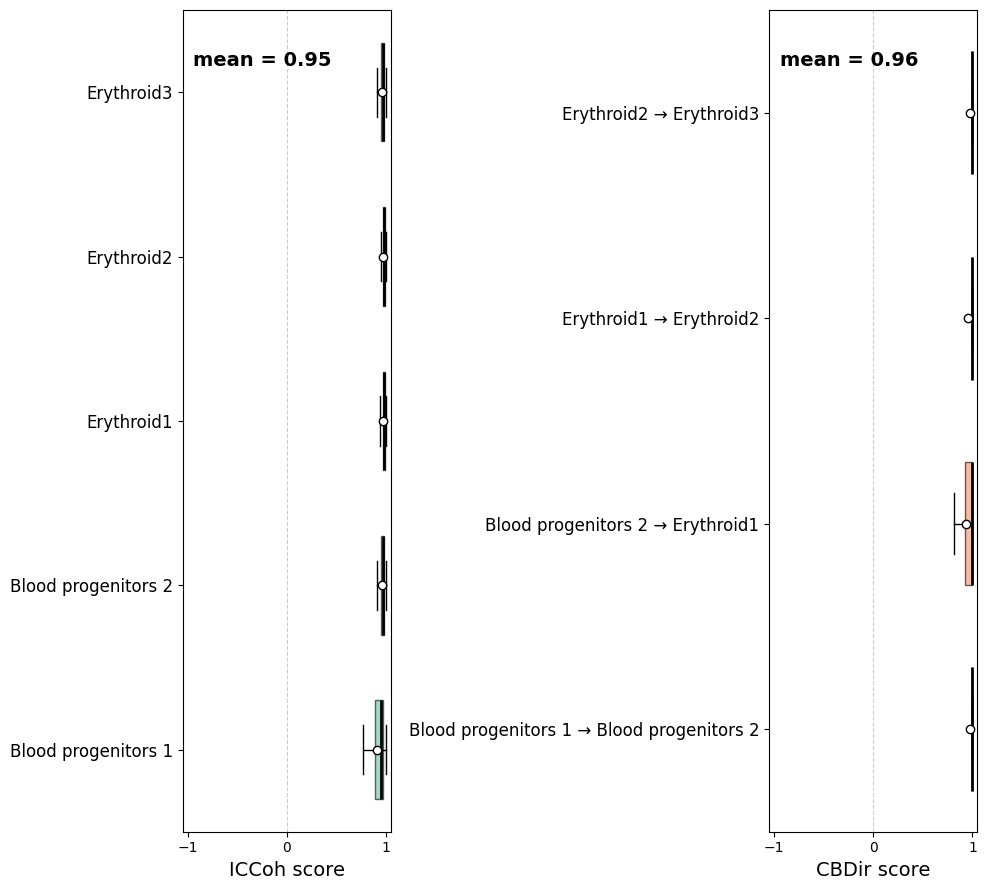

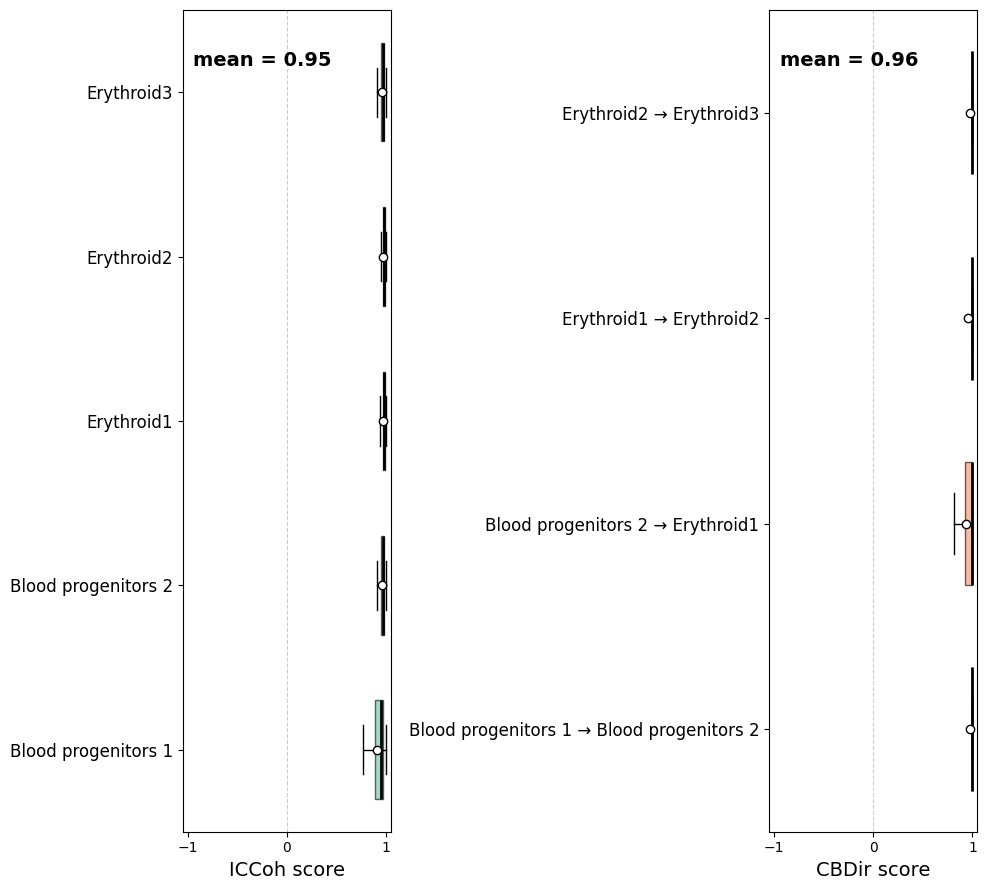

In [2]:
figures_path = "/home/user/Documents/velot/figures/figure 6"

# Load data
adata = velot.datasets.erythroid()

# Preprocess
scv.pp.filter_and_normalize(adata, min_shared_counts=20, min_shared_cells=10)
velot.pp.neighbors(adata, 20)
velot.pp.pseudotime(adata, root_cluster="Blood progenitors 1", cluster_key="celltype")
adata.obs["clusters_id"] = adata.obs["celltype"].cat.codes
adata.obsm["X_pca"] = adata.obsm["X_pca"][:,:10]

# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_pca",
    smooth=True,
    n_clusters=None,
    window_size=200,
    overlap_fraction=0,
    spatial_key="clusters_id",
    reg=0.05, lambda_time=1, n_epochs=300, lambda_smooth=0.2, lambda_curl=0.2, lambda_divergence=0,
    project_umap=True
)

# Visualize
# velot.pl.dataset_overview_simple(adata, color="celltype", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure4_a.png")
# velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure4_b.png")
# velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure4_c.png")
velot.pl.velocity_stream(adata, color="celltype", title=None, figsize=(5,5), save=f"{figures_path}/figure4_d.png")

# velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap_raw", show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap", show=True, save=f"{figures_path}/figure4_f.png")

# velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure4_g.png")

# Evaluate
edges = [
    ('Blood progenitors 1', 'Blood progenitors 2'), 
    ('Blood progenitors 2', 'Erythroid1'),
    ('Erythroid1', 'Erythroid2'), 
    ('Erythroid2', 'Erythroid3')
]

results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="celltype", velocity_key="velot_velocity_umap")
velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure4_h.png")

In [3]:
# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_pca",
    velocity_key="velot_velocity_umap",
    direction="forward",
    use_network=True,
    evolve_pseudotime=True,
    end_pseudotime=0.05,
    n_trajectories=30,
    cluster_key="celltype",
    n_steps=300, step_size=1
)

  Starting cells: 342 candidates (pseudotime=[min, 0.050])
  Total: 30 trajectories (forward) from 'None'
  Using continuous velocity field (neural network)
  Forward — Terminal clusters: {np.str_('Erythroid3'): np.int64(30)}


AnnData object with n_obs × n_vars = 9815 × 6173
    obs: 'sample', 'stage', 'sequencing.batch', 'theiler', 'celltype', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'dpt_pseudotime', 'pseudotime', 'clusters_id', 'velot_spatial_cluster', 'velot_confidence'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'MURK_gene', 'Δm', 'scaled Δm', 'gene_count_corr'
    uns: 'celltype_colors', 'neighbors', 'iroot', 'diffmap_evals', 'velot_windows', 'velot_smoothing', 'velot_trajectories'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'velot_velocity_pca', 'velot_velocity_pca_raw', 'velot_velocity_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

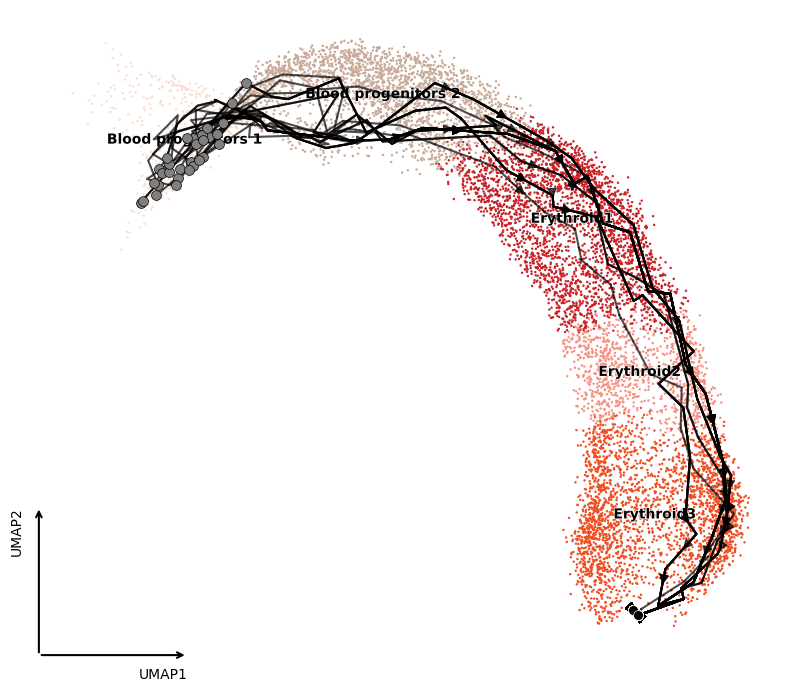

In [4]:
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=False, basis="umap", save=f"{figures_path}/figure4_i.png")

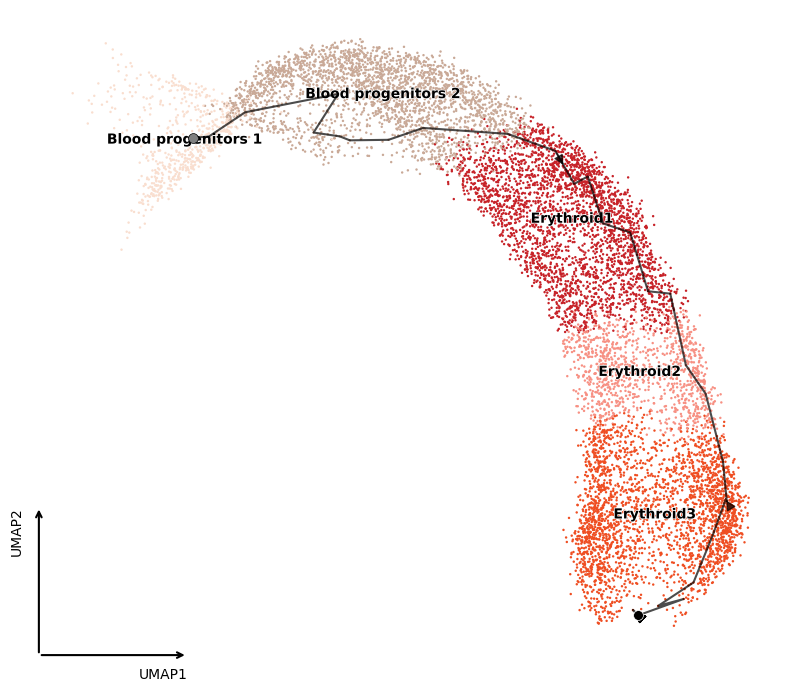

In [5]:
velot.pl.trajectories(
    adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
    show=False, basis="umap", save=f"{figures_path}/figure4_i.png", trajectory_ids=[6])

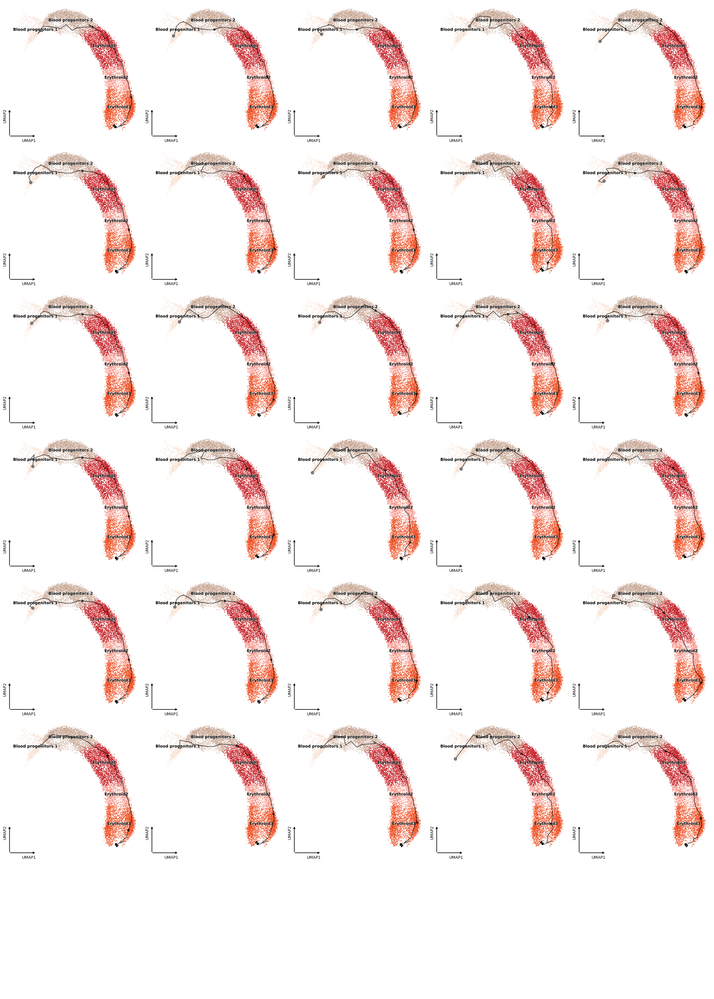

In [ ]:
import matplotlib.pyplot as plt

n = 30
cols = 5
rows = n // 5 + 1
s = 5
fig, axes = plt.subplots(rows, cols, figsize=(s*cols,s*rows))
axes = axes.flatten()

for i in range(n):
    axes[i] = velot.pl.trajectories(
        adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
        show=False, basis="umap", trajectory_ids=[i], ax=axes[i]
    )

# Hide unused subplots
for j in range(n, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

## Oligodendroglioma

In [76]:
import velot
import scanpy as sc
import scvelo as scv
import pandas as pd
import numpy as np

In [77]:
figures_path = "/home/user/Documents/velot/figures/figure 7"

# Load data
adata = sc.read_h5ad("/home/user/Documents/velot/notebooks/data/Oligodendroglioma/OG_processed_data.h5ad")

# Add four transitional states from https://pubmed.ncbi.nlm.nih.gov/27806376/
df = pd.DataFrame(
    adata.obsm["X_dif_stem"],
    index=adata.obs_names,
    columns=["X", "Y"]
)

adata.obs = adata.obs.join(df)
adata.obs["celltype"] = "Unassigned"
adata.obs.loc[(adata.obs["X"] <= 0), "celltype"] = "AC-like"
adata.obs.loc[(adata.obs["X"] >= 0.5), "celltype"] = "OC-like"
adata.obs.loc[(adata.obs["Y"] >= 0), "celltype"] = "Stem-like"

In [78]:
adata.obs["celltype2"] = "Unassigned"
adata.obs.loc[(adata.obs["Y"] >= 1), "celltype2"] = "Stem"

In [79]:
X = adata.X
if hasattr(X, "data"):  # sparse matrix
    X.data = np.nan_to_num(X.data, nan=0.0)
else:
    adata.X = np.nan_to_num(X, nan=0.0)

In [ ]:
if hasattr(X, "toarray"):  # sparse
    X = X.toarray()

n_cells, n_genes = X.shape
total_entries = n_cells * n_genes

# --- 2. Global NaN stats ---
nan_mask = np.isnan(X)
n_nan = nan_mask.sum()
pct_nan = 100 * n_nan / total_entries

print(f"Shape: {n_cells} cells × {n_genes} genes")
print(f"Total entries: {total_entries:,}")
print(f"NaNs: {n_nan:,} ({pct_nan:.4f}%)")

# --- 3. Per-cell and per-gene NaN counts ---
nan_per_cell = nan_mask.sum(axis=1)
nan_per_gene = nan_mask.sum(axis=0)

pct_nan_per_cell = nan_per_cell / n_genes
pct_nan_per_gene = nan_per_gene / n_cells

print("\nPer-cell NaN stats:")
print(f"  Mean: {pct_nan_per_cell.mean():.4f}")
print(f"  Max : {pct_nan_per_cell.max():.4f}")

print("\nPer-gene NaN stats:")
print(f"  Mean: {pct_nan_per_gene.mean():.4f}")
print(f"  Max : {pct_nan_per_gene.max():.4f}")

# --- 6. Heuristic recommendations ---
print("\n--- Recommendation ---")

if pct_nan < 0.01:
    print("✔ Very few NaNs (<0.01%) → safe to replace with 0.")
elif pct_nan < 0.1:
    print("✔ Low NaNs (<0.1%) → replace with 0, optionally inspect outliers.")
elif pct_nan < 1:
    print("⚠ Moderate NaNs (<1%) → consider filtering cells/genes with high NaN fraction.")
else:
    print("❌ High NaNs (>1%) → likely preprocessing issue, investigate upstream.")

# Identify problematic cells/genes
cell_threshold = 0.1   # 10% NaNs in a cell
gene_threshold = 0.1   # 10% NaNs in a gene

bad_cells = np.where(pct_nan_per_cell > cell_threshold)[0]
bad_genes = np.where(pct_nan_per_gene > gene_threshold)[0]

print(f"\nCells with >10% NaNs: {len(bad_cells)}")
print(f"Genes with >10% NaNs: {len(bad_genes)}")

# --- 7. Suggested fixes (not applied automatically) ---
print("\n--- Suggested actions ---")
print("Replace NaNs with 0:")
print("    adata.X = np.nan_to_num(adata.X, nan=0.0)")
print("\nFilter bad cells:")
print("    adata = adata[pct_nan_per_cell <= 0.1].copy()")
print("\nFilter bad genes:")
print("    adata = adata[:, pct_nan_per_gene <= 0.1].copy()")

Shape: 4347 cells × 23686 genes
Total entries: 102,963,042
NaNs: 0 (0.0000%)

Per-cell NaN stats:
  Mean: 0.0000
  Max : 0.0000

Per-gene NaN stats:
  Mean: 0.0000
  Max : 0.0000

--- Recommendation ---
✔ Very few NaNs (<0.01%) → safe to replace with 0.

Cells with >10% NaNs: 0
Genes with >10% NaNs: 0

--- Suggested actions ---
Replace NaNs with 0:
    adata.X = np.nan_to_num(adata.X, nan=0.0)

Filter bad cells:
    adata = adata[pct_nan_per_cell <= 0.1].copy()

Filter bad genes:
    adata = adata[:, pct_nan_per_gene <= 0.1].copy()


In [80]:
dif_stem = True

# Pseudotime using non Nan for neighbors
sc.pp.filter_cells(adata, min_counts=20)
sc.pp.filter_genes(adata, min_cells=10)

if dif_stem:
    mask = ~np.isnan(adata.obsm["X_dif_stem"]).any(axis=1)
    adata = adata[mask].copy()
    adata.obsm["X_umap"] = adata.obsm["X_dif_stem"]
    sc.pp.neighbors(adata, 20, use_rep="X_umap")

else:
    sc.pp.neighbors(adata, 20)
    sc.pp.pca(adata, 50)
    sc.tl.umap(adata)
    adata.obsm["X_pca_raw"] = adata.obsm["X_pca"]
    adata.obsm["X_umap_raw"] = adata.obsm["X_umap"]

velot.pp.pseudotime(adata, root_cluster="Stem", cluster_key="celltype2")
adata.obs["celltype"] = adata.obs["celltype"].astype("category")
adata.obs["clusters_id"] = adata.obs["celltype"].cat.codes

VelOT: Computing velocity field
  Basis: X_umap (2D)
  Cells: 4044
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Spatial clustering: 4 clusters via KMeans on X_umap (2D)
  Built 25 window pairs across 4 clusters (skipped 0 small clusters)
  Window size: 150, step: 150

[2/4] Computing OT velocity...
  OT velocity computed: 3750 cells with velocity, 294 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.2773 reg=0.0130 smooth=0.0000 curl=0.0000
    epoch 100/300: total=0.7821 reg=0.0078 smooth=0.0000 curl=0.0001
    epoch 150/300: total=1.8636 reg=0.0192 smooth=0.0000 curl=0.0000
    epoch 200/300: total=2.4729 reg=0.0260 smooth=0.0000 curl=0.0000
    epoch 250/300: total=2.2777 reg=0.0237 smooth=0.0000 curl=0.0000
    epoch 300/300: total=1.4272 reg=0.0146 smooth=0.0000 curl=0.0000
  Smoothing complete: final total=1.4272

[4/4] UMAP projection: SKIPPED

VelOT: Done.


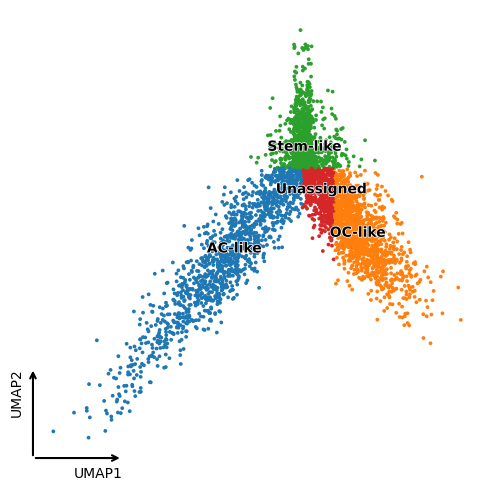

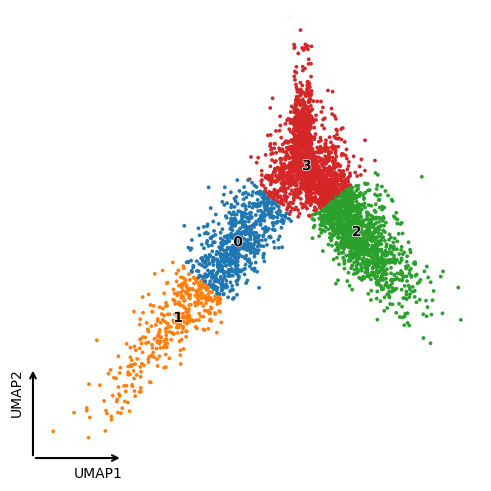

Plotting in scanpy


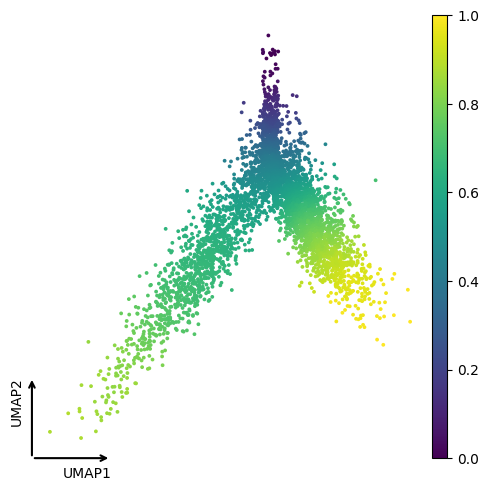

Plotting in scanpy


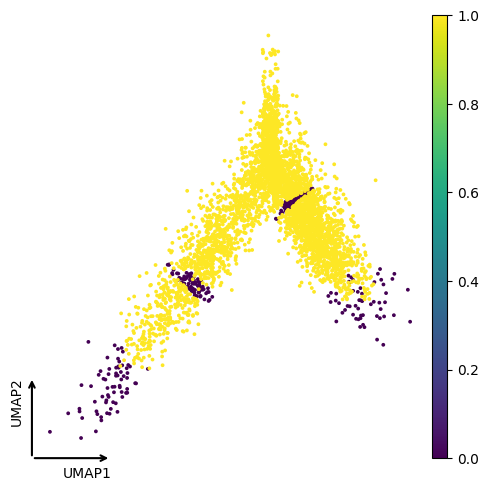

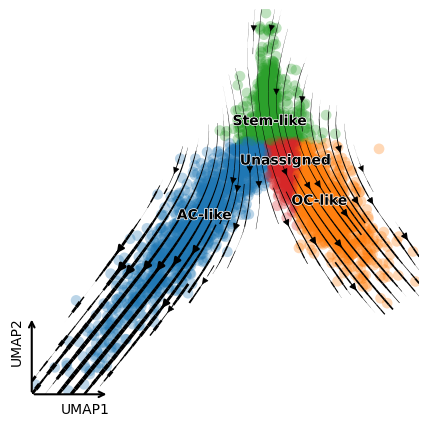

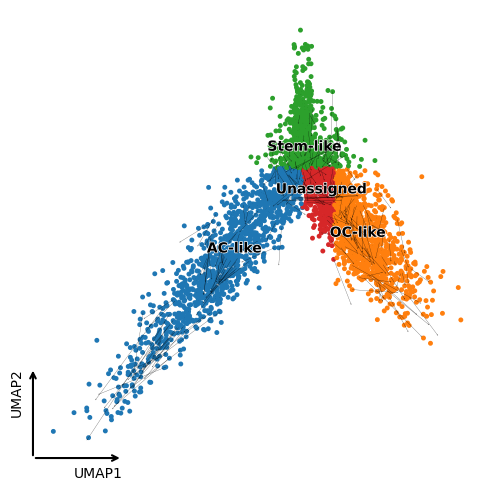

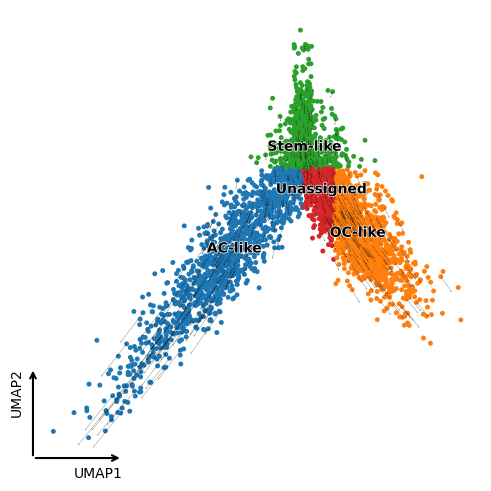

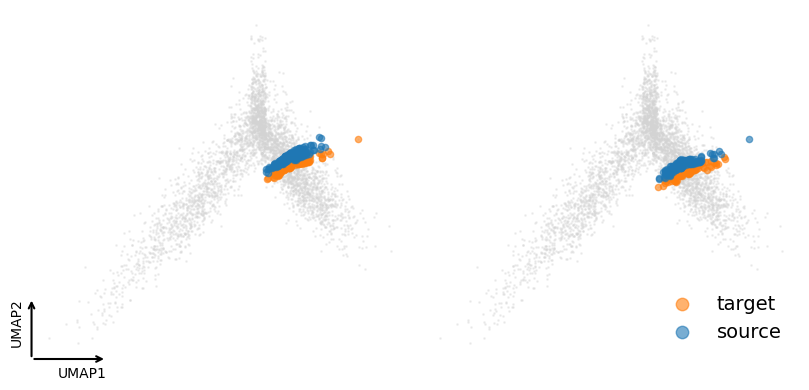

VelOT Velocity Metrics

Inner-Cluster Coherence (mean: 1.000):
                    AC-like: 1.000
                    OC-like: 1.000
                  Stem-like: 0.999
                 Unassigned: 1.000

Cross-Boundary Correctness (mean: 0.992):
        Stem-like → OC-like        : 1.000
        Stem-like → AC-like        : 0.984


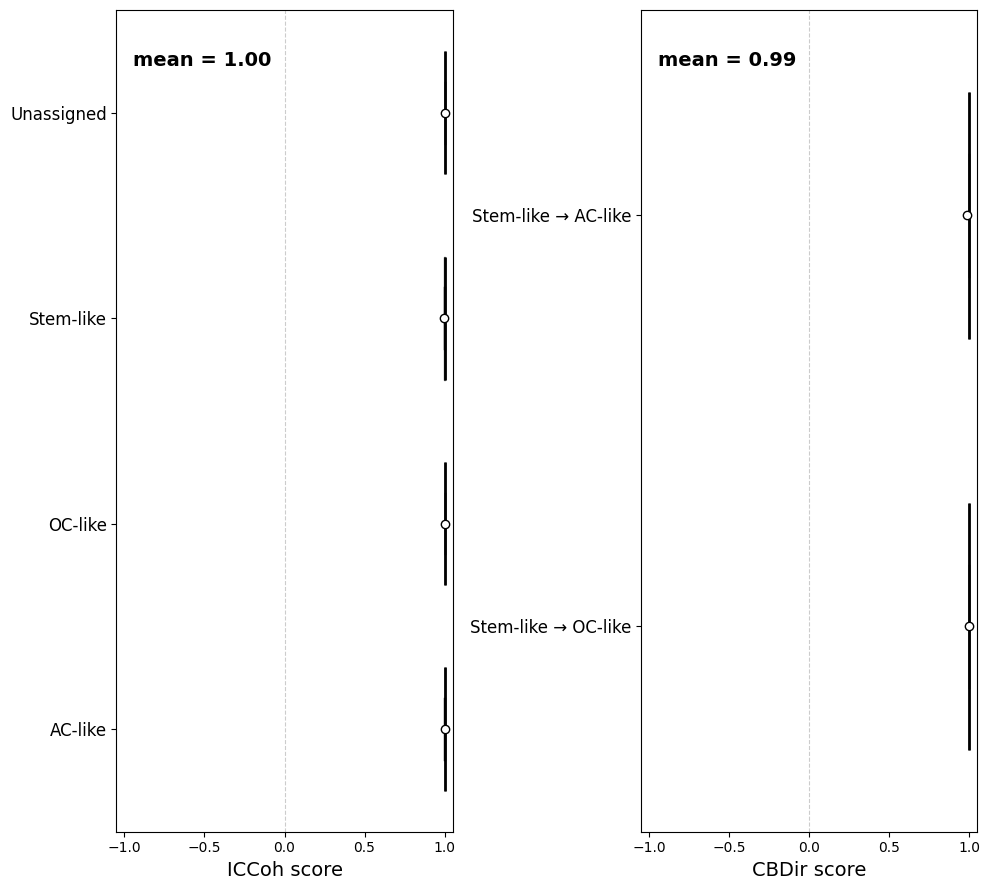

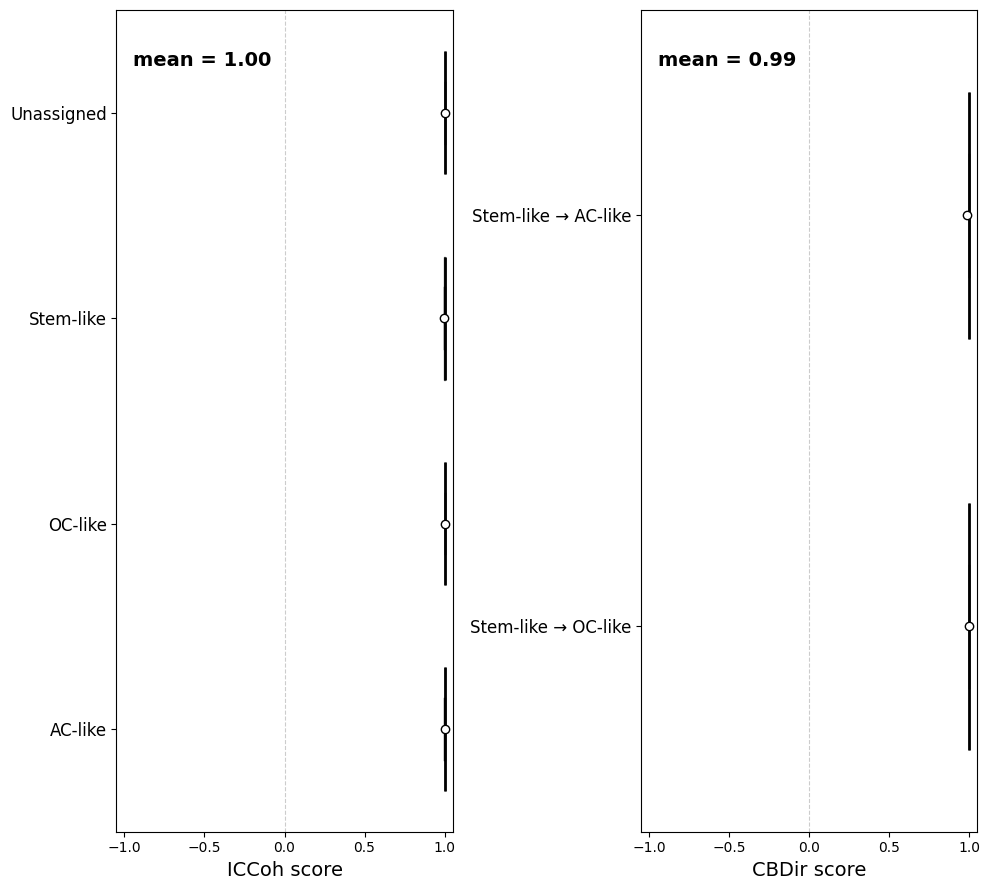

In [81]:
# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_umap",
    smooth=True,
    n_clusters=4,
    window_size=150,
    overlap_fraction=0,
    # spatial_key="clusters_id",
    reg=0.05, lambda_time=1, n_epochs=300, lambda_smooth=0.2, lambda_curl=0.2, lambda_divergence=0.0,
    project_umap=False
)

# Visualize
velot.pl.dataset_overview_simple(adata, color="celltype", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure4_a.png")
velot.pl.dataset_overview_simple(adata, color="velot_spatial_cluster", title="", figsize=(5,5), inframe=True, out_legend=False)
velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure4_b.png")
velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure4_c.png")
velot.pl.velocity_stream(adata, color="celltype", title=None, figsize=(5,5), save=f"{figures_path}/figure4_d.png", min_mass=0, density=2, cutoff_perc=0, linewidth=1.5)

velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap_raw", show=True, save=f"{figures_path}/figure4_e.png")
velot.pl.velocity_quiver(adata, color="celltype", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap", show=True, save=f"{figures_path}/figure4_f.png")

velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure4_g.png")

# Evaluate
edges = [
    ('Stem-like', 'OC-like'), 
    ('Stem-like', 'AC-like')
]

results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="celltype", velocity_key="velot_velocity_umap")
velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure4_h.png")

In [ ]:
adata.write("oligodendroglioma_velot.h5ad")

In [55]:
# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_umap",
    velocity_key="velot_velocity_umap",
    direction="forward",
    use_network=True,
    evolve_pseudotime=True,
    start_pseudotime=0.2,
    end_pseudotime=0.4,
    n_trajectories=10,
    cluster_key="celltype",
    n_steps=300, step_size=1
)

  Starting cells: 418 candidates (pseudotime=[0.200, 0.400])
  Total: 10 trajectories (forward) from 'None'
  Using continuous velocity field (neural network)
  Forward — Terminal clusters: {np.str_('AC-like'): np.int64(2), np.str_('OC-like'): np.int64(7), np.str_('Unassigned'): np.int64(1)}


AnnData object with n_obs × n_vars = 4044 × 19219
    obs: 'cell_type_group', 'cell_type_subgroup', 'X', 'Y', 'celltype', 'celltype2', 'n_counts', 'dpt_pseudotime', 'pseudotime', 'clusters_id', 'velot_spatial_cluster', 'velot_confidence'
    var: 'n_cells'
    uns: 'neighbors', 'iroot', 'diffmap_evals', 'velot_windows', 'velot_smoothing', 'celltype_colors', 'velot_spatial_cluster_colors', 'velot_trajectories'
    obsm: 'X_cell_cycle', 'X_dif_stem', 'X_umap', 'X_diffmap', 'velot_velocity_umap', 'velot_velocity_umap_raw'
    obsp: 'distances', 'connectivities'

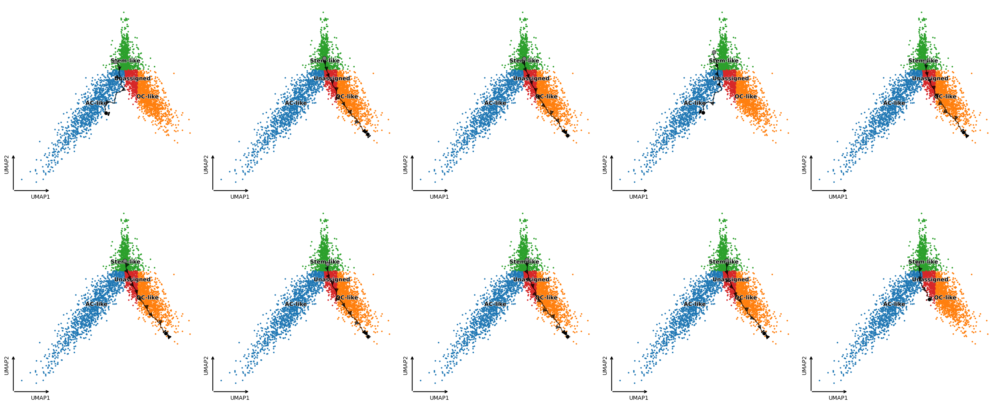

In [58]:
import matplotlib.pyplot as plt

n = 10
cols = 5
rows = n // 5 + 1
s = 5
fig, axes = plt.subplots(rows, cols, figsize=(s*cols,s*rows))
axes = axes.flatten()

for i in range(n):
    axes[i] = velot.pl.trajectories(
        adata, color="celltype", line_width=1.5, line_style="-", arrow_frequency=10, arrow_size=15,
        show=False, basis="umap", trajectory_ids=[i], ax=axes[i]
    )

# Hide unused subplots
for j in range(n, len(axes)):
    axes[j].remove()

plt.tight_layout()
plt.show()

# Murine

In [84]:
import velot
import scanpy as sc
import scvelo as scv

VelOT: Computing velocity field
  Basis: X_pca (10D)
  Cells: 3452
  Smoothing: ON

[1/4] Building spatial-temporal windows...
  Spatial clustering: 30 clusters via KMeans on X_pca (10D)
  Built 39 window pairs across 26 clusters (skipped 4 small clusters)
  Window size: 200, step: 200

[2/4] Computing OT velocity...
  OT velocity computed: 2481 cells with velocity, 971 cells without (will be filled by smoothing)

[3/4] Smoothing velocity field...
    epoch 50/300: total=1.0611 reg=3.9670 smooth=0.0063 curl=0.0005
    epoch 100/300: total=1.0462 reg=4.1007 smooth=0.0032 curl=0.0002
    epoch 150/300: total=1.0549 reg=4.1231 smooth=0.0035 curl=0.0001
    epoch 200/300: total=1.0731 reg=4.1761 smooth=0.0039 curl=0.0001
    epoch 250/300: total=0.9803 reg=3.8157 smooth=0.0035 curl=0.0001
    epoch 300/300: total=0.9245 reg=3.5876 smooth=0.0035 curl=0.0001
  Smoothing complete: final total=0.9245

[4/4] Projecting to UMAP...
  Velocity projected to UMAP (3452 cells)

VelOT: Done.


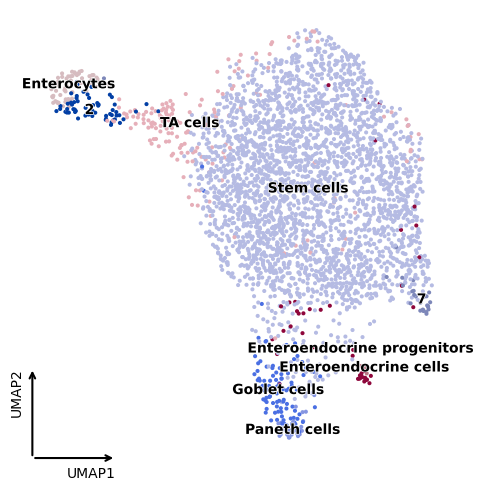

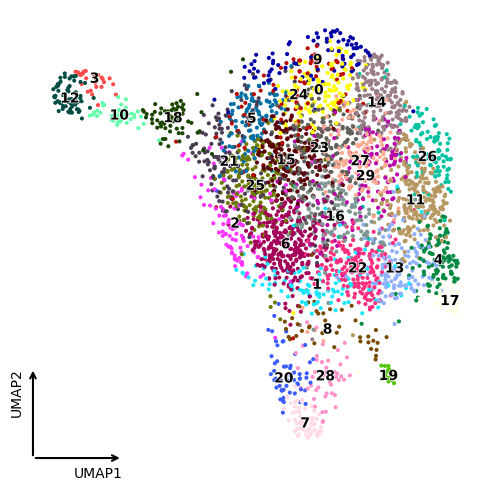

Plotting in scanpy


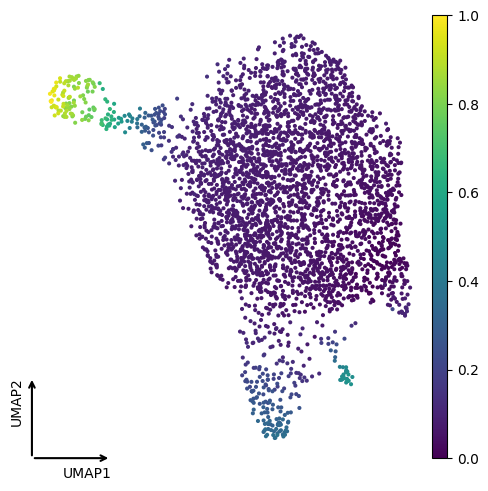

Plotting in scanpy


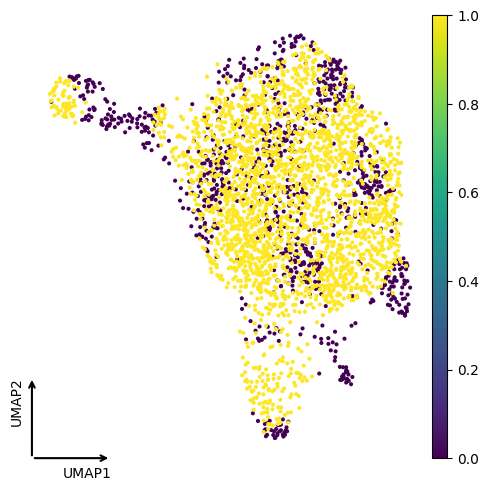

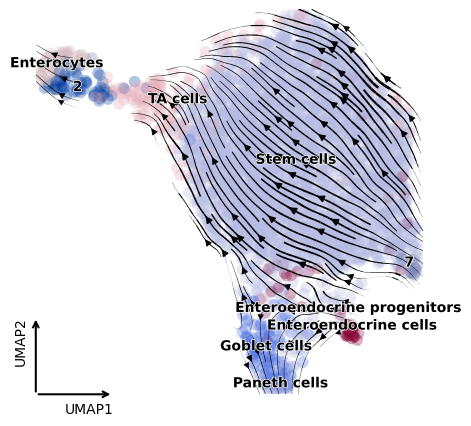

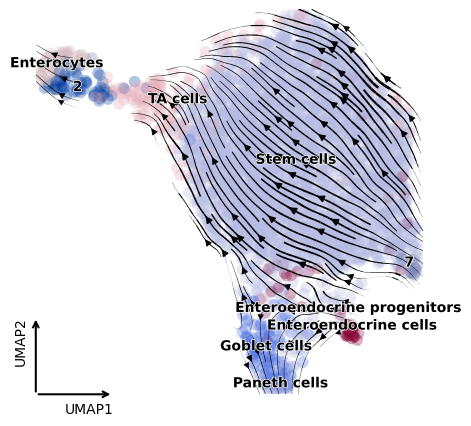

In [85]:
figures_path = "/home/user/Documents/velot/figures/figure 8"

# Load data
adata = sc.read_h5ad("/home/user/Documents/velot/notebooks/data/Murine/preprocessed.h5ad")

# Preprocess
velot.pp.pseudotime(adata, root_cluster="Stem cells", cluster_key="cell_type")
adata.obs["clusters_id"] = adata.obs["cell_type"].cat.codes
adata.obsm["X_pca"] = adata.obsm["X_pca"][:,:10]

# Compute velocity (full pipeline)
velot.tl.velocity(
    adata=adata,
    basis="X_pca",
    smooth=True,
    n_clusters=None,
    window_size=200,
    overlap_fraction=0,
    # spatial_key="clusters_id",
    reg=0.05, lambda_time=1, n_epochs=300, lambda_smooth=0.2, lambda_curl=0.2, lambda_divergence=0,
    project_umap=True
)

# Visualize
velot.pl.dataset_overview_simple(adata, color="cell_type", title="", figsize=(5,5), inframe=True, out_legend=False, save=f"{figures_path}/figure4_a.png")
velot.pl.dataset_overview_simple(adata, color="velot_spatial_cluster", title="", figsize=(5,5), inframe=True, out_legend=False)
velot.pl.dataset_overview_simple(adata, color="pseudotime", title="", save=f"{figures_path}/figure4_b.png")
velot.pl.dataset_overview_simple(adata, color="velot_confidence", title="", save=f"{figures_path}/figure4_c.png")
velot.pl.velocity_stream(adata, color="cell_type", title=None, figsize=(5,5), save=f"{figures_path}/figure4_d.png")

# velot.pl.velocity_quiver(adata, color="cell_type", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap_raw", show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.velocity_quiver(adata, color="cell_type", basis="umap", title="", subsample=500, figsize=(5,5), velocity_key="velot_velocity_umap", show=True, save=f"{figures_path}/figure4_f.png")

# velot.pl.windows(adata, pairs_to_show=(6, 7), figsize_per_panel=(4,4), show=True, save=f"{figures_path}/figure4_e.png")
# velot.pl.training_curves_single(adata, True, figsize=(7,7), save=f"{figures_path}/figure4_g.png")

# Evaluate
# edges = [
#     ('Blood progenitors 1', 'Blood progenitors 2'), 
#     ('Blood progenitors 2', 'Erythroid1'),
#     ('Erythroid1', 'Erythroid2'), 
#     ('Erythroid2', 'Erythroid3')
# ]

# results = velot.metrics.summary(adata, cluster_edges=edges, cluster_key="celltype", velocity_key="velot_velocity_umap")
# velot.pl.metric_summary(results, orientation="horizontal", layout="row", figsize=(10,9), save=f"{figures_path}/figure4_h.png")

In [ ]:
# Trajectories using the continuous field with evolving pseudotime
velot.tl.compute_trajectories(
    adata,
    basis="X_pca",
    velocity_key="velot_velocity_umap",
    direction="forward",
    use_network=True,
    evolve_pseudotime=True,
    end_pseudotime=0.05,
    n_trajectories=30,
    cluster_key="celltype",
    n_steps=300, step_size=1
)

  Starting cells: 342 candidates (pseudotime=[min, 0.050])
  Total: 30 trajectories (forward) from 'None'
  Using continuous velocity field (neural network)
  Forward — Terminal clusters: {np.str_('Erythroid3'): np.int64(30)}


AnnData object with n_obs × n_vars = 9815 × 6173
    obs: 'sample', 'stage', 'sequencing.batch', 'theiler', 'celltype', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'dpt_pseudotime', 'pseudotime', 'clusters_id', 'velot_spatial_cluster', 'velot_confidence'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'MURK_gene', 'Δm', 'scaled Δm', 'gene_count_corr'
    uns: 'celltype_colors', 'neighbors', 'iroot', 'diffmap_evals', 'velot_windows', 'velot_smoothing', 'velot_trajectories'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'velot_velocity_pca', 'velot_velocity_pca_raw', 'velot_velocity_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

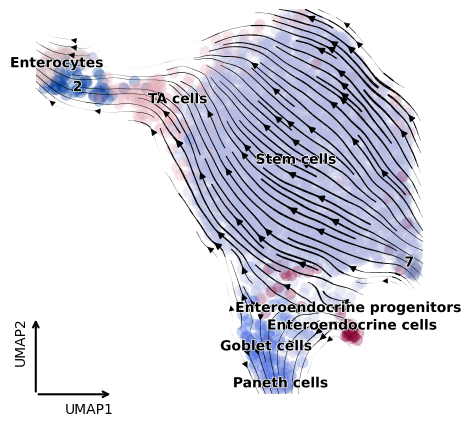

In [75]:
velot.pl.velocity_stream(adata, color="cell_type", title=None, figsize=(5,5), min_mass=0, density=2, cutoff_perc=0, linewidth=1, show=False)